### 筛选数据

In [63]:
import pandas as pd
df = pd.read_csv('E:\\opensky\\states_2021-08-30-00.csv')
df  = df[df['onground']== False]
data = pd.DataFrame(df,columns=['time','icao24', 'lat', 'lon', 'baroaltitude'])
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1784707 entries, 0 to 1882086
Data columns (total 5 columns):
 #   Column        Dtype  
---  ------        -----  
 0   time          int64  
 1   icao24        object 
 2   lat           float64
 3   lon           float64
 4   baroaltitude  float64
dtypes: float64(3), int64(1), object(1)
memory usage: 81.7+ MB


In [64]:
test = data
# 统计缺失数据
null_data = test[test.isnull().values==True]
null_data.info()
# 统计出缺失数据的icao24
null_icao24 = null_data['icao24'].unique()
print(len(null_icao24))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 367255 entries, 8 to 1882062
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   time          367255 non-null  int64  
 1   icao24        367255 non-null  object 
 2   lat           932 non-null     float64
 3   lon           932 non-null     float64
 4   baroaltitude  88748 non-null   float64
dtypes: float64(3), int64(1), object(1)
memory usage: 16.8+ MB
3024


In [65]:
# 去除NAN值，只保留不存在缺失值的数据
all_icao24 = data['icao24'].unique()
save_icao24 = [id for id in all_icao24 if id not in null_icao24]
fileter_data = test[test['icao24'].isin(save_icao24)]
fileter_data.head()

,time,icao24,lat,lon,baroaltitude
1,1630281600,a6c4f0,37.772113,-121.783388,1188.72
2,1630281600,a74c29,38.870087,-120.083134,7917.18
3,1630281600,06a120,37.876373,-122.188539,2324.10
4,1630281600,a5d140,37.792511,-121.930243,7223.76
5,1630281600,406948,37.414313,-122.345362,2522.22


In [66]:
# 去除NAN
# data.dropna(axis=0, inplace=True)

fileter_data.sort_values(by=['time', 'icao24'], inplace=True)
# 判断空值
fileter_data.isna().sum()

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


time            0
icao24          0
lat             0
lon             0
baroaltitude    0
dtype: int64

In [67]:
# 插值
# data.interpolate(inplace=True)
fileter_data.info()
fileter_data.head(10)
fileter_data.to_csv('fileter.csv',index=False)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1249409 entries, 3 to 1879423
Data columns (total 5 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   time          1249409 non-null  int64  
 1   icao24        1249409 non-null  object 
 2   lat           1249409 non-null  float64
 3   lon           1249409 non-null  float64
 4   baroaltitude  1249409 non-null  float64
dtypes: float64(3), int64(1), object(1)
memory usage: 57.2+ MB


In [68]:
print(len(save_icao24))

# 取前500条航迹
target_icao24 = save_icao24[:500]
target_icao24

6107


['a6c4f0',
 'a74c29',
 '06a120',
 'a5d140',
 '406948',
 '4bccba',
 'a74764',
 'aaa593',
 'a3b8e1',
 'a87f41',
 'ab1817',
 '8518f2',
 'a0c922',
 'a34bf7',
 'a120fe',
 'ad12e0',
 'e483ba',
 'a137af',
 'ade543',
 'a7ac0f',
 'c038ac',
 'a0d561',
 '7c6db9',
 '800d33',
 'e4949f',
 'a15212',
 'a0563b',
 'a2b7c6',
 'a0acfd',
 'a69c64',
 'a40312',
 'ab6f3d',
 'a82a06',
 'ac5cd7',
 'ad0f29',
 'a3ec77',
 'c03330',
 'a38c95',
 '7c2fd3',
 'a53b06',
 'a46ad6',
 'a9a419',
 'a02cf1',
 '8013f8',
 'ad83b2',
 'a08e3c',
 'a5f162',
 'c0524c',
 'ac53be',
 'ab2fb5',
 'ac9e9f',
 'a3271e',
 'aaa992',
 'ab4deb',
 'a16068',
 '7c7b5b',
 'a4491f',
 '8a0377',
 '84b794',
 '42443b',
 'ac5488',
 '846866',
 'aa7734',
 '39c48d',
 'a2bb10',
 '71c038',
 'a4ec6b',
 'a3e55a',
 'a35aa4',
 'a2f306',
 'a6dc36',
 'a0d374',
 'a7d085',
 'abbd2d',
 'a7ede3',
 '491d81',
 'a7d771',
 'a8ec57',
 '406e66',
 'a447cd',
 'a920f4',
 'a68caa',
 'c02655',
 'a03397',
 '02a1b3',
 'abc14d',
 'a7fed0',
 'a6e72d',
 'a8e733',
 'a67a34',
 'a4d2c9',

In [69]:
# 对数据进行可视化分析
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
def show_3D(obs_traj):
    fig = plt.figure()
    ax = Axes3D(fig)
    line_width = 0.5
    ax.plot(obs_traj[:, 2], obs_traj[:, 3], obs_traj[:, 4], color='r', label='traj',linewidth=line_width)
    ax.legend()
    plt.show()


In [70]:
# for id in target_icao24:
#     plt_data = fileter_data[fileter_data['icao24'] ==id]
#     print(id)
#     show_3D(np.array(plt_data))

In [71]:
abandon_id = ['a74c29', 'aaa593', 'a0c922', 'a34bf7', 'a120fe', 'a137af', 'c038ac', 'a0d561', 'ab6f3d', 'c03330',
             'c03330', '7c2fd3', 'a53b06', 'c0524c', 'ac53be', '7c7b5b', '42443b', 'ac5488', 'a8ec57', 'a4d2c9',
             'a96810', 'ad574f', 'a0ebab', 'a99a3d', 'a403b3', 'aa7bd6', 'a721a4', 'acd650', 'c018c8', 'a1f595',
             '4ca6e6', '4bb849', '43bea8', 'a63b0b', 'a1f1d2', 'ac1dfa', '4aca53', 'a5c239', 'ac4217', 'a02862',
             'a17142', '7c6de7', 'a526e6', '7c2530', 'a89ab9', 'a75b65', '7c1ae7', 'ac9e4e', 'a08efd', 'aa1e28',
             'a2f5b4', '76aa6f', '86dd2a', 'a9f2e5', 'a6141a', 'a9e8f7', 'a2e1ce', '515147', 'adde95', '3c4585', 
              'ac1d80', '7c2e55', '4c01e4', 'a15fbb', '4cc53d', 'a5521b', 'a77e97', 'a465ac', 'a510ee', '491d81',
              '899032', 'a510ee', 'a4f488', 'a4c876', '4aca66', 'a59021', 'a18cbb', 'a809f5', 'a235b7', 'aa6aa1',
              'ac7b1b', 'a04f75', 'a732d9', '4b82e9', 'a0e607', 'a909b8', 'a68bd8', 'a68bd8', 'a248ee', 'a57d52',
              'aba64f', 'a890c7', 'a42665', 'ad14af', 'a324c0', '0d08b3', 'a4c036', 'a5b954', 'ad3997', 'acb89b',
              '4cc534', '7cf9c9', '7c7fbe', 'ade569', 'ade569', '471efd', 'ab6ea5', '7c81ce', 'a38211', '7c5bd6',
              'ac733b', 'a88df0', 'a84970', 'c07eda', '424362', 'a55b64', 'a7bbb2', 'ab0971', 'a494c5', 'a121f2',
              'a01112', 'a29661', 'a04f49', 'a4189f', 'a96483', '495179', 'adb34f', 'a21432', 'a3f7da', 'a3f7da',
              '7c7ff8', '471f6f', 'aa2a54', 'a2f2a3', 'aaa4be', 'a62201', 'a9f5c2', 'ac231f', 'abb624', 'ac95c1',
              'a44548', '7cfa05', 'ad2ea4', 'a6134f', 'a57dbe', 'a9daf0', 'a7acc5', 'e48c82', 'acb59c', 'a0477b',
              '471f75', 'a3043b', '7cf9ee', '48ae26', '471f3c', 'ab2ae0', 'a03235', 'acb963', 'acb963', 'a32005',
              'add2b6', '4bb463', 'aa696b', 'a445f8', 'a8d3b4', 'ad4d5d', 'a5db31', '778827', 'a7a510', 'a7a510',
              'a8de56', '4bb859', '800463', 'a6e2f3', 'c02cf1', 'acddbe', 'acddbe', '424360', '7c4487', 'a2e585',
              'a2e585', 'a16ebc', '44cca1', '7c7646', 'ac4816', 'ac4816', 'ac4816', '4d012c', 'a1878a', 'a78a52',
              'ac9d88', 'a0f01a', 'abdcbe', '4bb288', 'aa1a81', 'aa1a81', 'a82520', 'a82286', 'a82286', '4d010d',
              'ad084e', '4243ff', 'a03071', 'a4dba8', 'a4dba8', 'c0307a', 'a2228b', 'a13501', 'a5a8a9', 'a7cb20',
              '8964b1', 'a057eb', 'a69de6', 'a0818d', 'a41e2c', 'acb285', 'ad6c3b', '14fa18', 'aa7dad', 'a05b78', 
              'ab7b8c', 'a8fc06', 'abc0c1', 'a68e9b', 'a3c8cb', 'a8e20f', 'a9360e', '440549', 'a32b04', '76eb00', 
              'aa3086', 'acda07', 'a63b28', 'a66e58', '0d07c3', 'ab9091', 'a0791e', 'a948c4', 'a12260', 'a0a545',
              'a22952', 'a40b12', 'a29cbf', 'a9450d', 'a1c534', 'a2ffcb', 'a262ad', 'abd5e0', 'a8b024', 'a68d6f',
              'c079d5', 'a2ded8', 'a95fd1', '0d0b35', 'a2e561', '894097', 'a78cc5', 'ae10b3', '4bb18d', 'a1be72',
              '7c4e34', 'a9d1c5', 'c06b76', '0d0984', '87304a', 'a74a5a', 'a22b8d', 'c0103a', '4d22a3', '0101ba',
              'aaa6d8', 'ab1971', 'ae1458', '0d0947', 'abb440', 'a8abe1', 'a31cb7', '7cfa02', '8527e8', 'a0ad6c',
              'ab3748', 'a1b4e1', 'a3cdb2', 'a7c3a7', 'a3b4c7', '440a8c', 'ace175', 'a52c8d', 'a50958', 'a85119',
              '4bab4e', 'a1ebd4', 'a3f4b2', 'aab5b2', 'a1e4f2', 'abd3c7', 'a6caa4', 'a7a1e8', 'a728c1', 'a517a1',
              'a6c30a', 'a12861', '42439f', 'acaf0b', 'a3cd27', 'acd442', 'a3cd27', 'acd442', '8a0378', 'a7c866',
              '780417', 'aaa929', 'aa3b75', 'a91349', 'a99686', 'a82c8c', '0c20bb', 'c038cc', 'a4e115', '7cf9fd',
              'a86e6c', 'ac0dd9', 'ad945a', 'ace8bd', 'a80626', 'a5ee51', '7c6590', 'a0acf8', '4063e6', 'a80523',
              'a8ebca', 'a2c934', 'abbdfa', 'aa77f9', '44a98f', 'a67395', 'a6e4e8', 'a459a4', '424396', 'a1377e',
              'a403ca', 'ad605e', 'ac9ab0', 'c04b57', 'aa1568', 'a4dd65', 'ab128d', 'a6c013', 'c038a3', 'a717b6',
              'a44e59', 'a44e59', 'c058c2', 'ada302', 'a2b2e1', '7c2fe7', 'acdbf4', '504e57', '7380c4', 'adabfe',
              'a305aa', 'a3e6b1', 'a622bc', '71ba07', 'a2cf3b', 'a34c58', 'a2f4cc', '06a081', 'a26535', '78922f',
              'a8102a', 'ace468', 'ab3964', 'a8795a', 'a9e6cb', 'aa7a83', 'a1cc9a', 'a66be6', 'c03d27', 'a1ac24',
              '4005bf', '43ead4', 'a00d5b', 'ad1560', 'ab97e6', '7c3635', 'ab362c', 'aa80c0', 'a2cffc', 'ac53a0',
              'c04d98', '491d83', '48ae00', 'a9704d', 'a1057a', '7c6aea', 'a6b07e', 'a3b852', 'a00e22', 'a5d668',
              'a6637c', 'a0b18e', 'a6fc64', 'a174f7', '7c1a88', 'aaa5af', 'a7bf85', 'a37ab5', 'ad493b', '49d418', 
              'a0a529', 'a67928', 'adc238', 'ac990b', 'a82542', 'ac576e', 'a69f49', 'a923a7', 'a70c67', 'ac76f2',
              'a95a83', '4baa67', '424498', 'a33e4a', 'ad1927', 'a1dada', 'a5a98d', '7c77bd', 'a174e7', 'adda48',
              'c05dab', 'ac3d60', 'a3d0fe', 'e491d6', 'ab0299', 'a1f025', 'aab129', 'abb1de', 'a4bb8a', 'ad26c8', 
              'a6a2c2', 'a2ab41', 'a44262', '78007e', 'ad2af2', 'a01c37', 'a098f6', 'adb1ed', 'a0d21f', '4bb274',
              'a6ab93', '8990d9', 'a34ffa', 'a31b9e', 'c07966', 'c06a75', 'a173a8', 'a22482', '471f39', 'aae952',
              'a5b768', 'a34b0a', 'adf068', 'adf068', '7c6db9', 'a9a419', 'a2f306', 'a2f306', 'c02655', 'abc14d', 
              'abc14d', 'a6de16', 'ac06f5', '406d79', 'a593e4', 'a9d651', 'a4d65c', 'a6c4f0', 'a3ec77', 'a68caa', 
              'a1e0c8', 'a85c0c', 'ad7ab8', 'ab678e', 'ac20a1', '7c581d', 'a32fd5', 'ad5dcb', 'ab4af1', 'a149f1',
              '471efb', 'a50a88', 'a95d8f', 'adba37', '8991ab', 'a1383c', '7c7f5a', 'aa05f6', 'ab4e94', 'a332e6',
              '4ba94d', '800c68', 'a3db5e', 'aa9d1a', 'a89f62', 'a89a9a', 'a00b98', 'a16ff1', 'aa02ab', 'a5f5bf',
              'a61d00', 'a3904c', 'a678e5', 'e48e78', 'a48321']

In [72]:
icao24_list = [id for id in target_icao24 if id not in abandon_id]
print(len(icao24_list))
preprocess_data = fileter_data[fileter_data['icao24'].isin(icao24_list)]
preprocess_data.info()

346
<class 'pandas.core.frame.DataFrame'>
Int64Index: 78245 entries, 3 to 1880036
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   time          78245 non-null  int64  
 1   icao24        78245 non-null  object 
 2   lat           78245 non-null  float64
 3   lon           78245 non-null  float64
 4   baroaltitude  78245 non-null  float64
dtypes: float64(3), int64(1), object(1)
memory usage: 3.6+ MB


a6c4f0


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


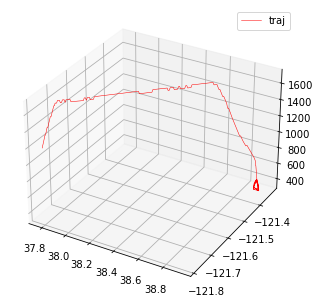

06a120


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


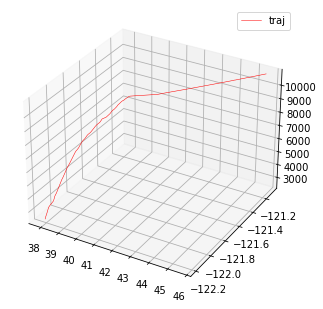

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a5d140


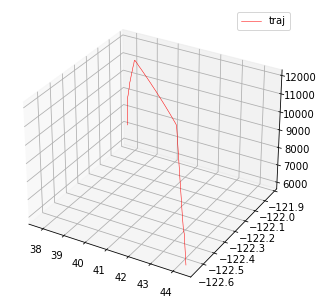

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


406948


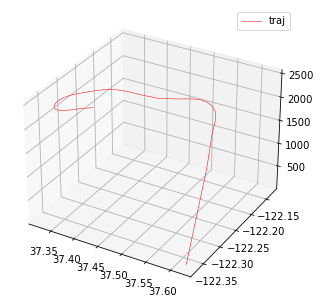

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


4bccba


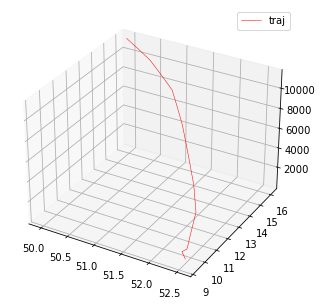

a74764


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


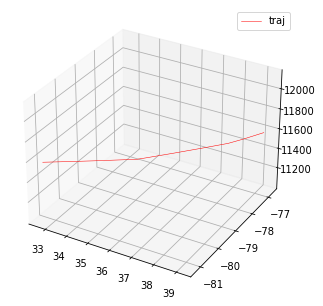

a3b8e1


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


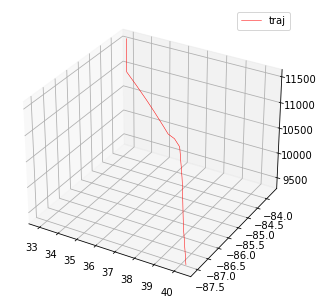

a87f41


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


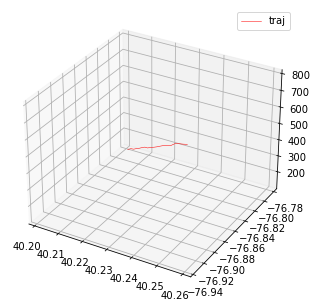

ab1817


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


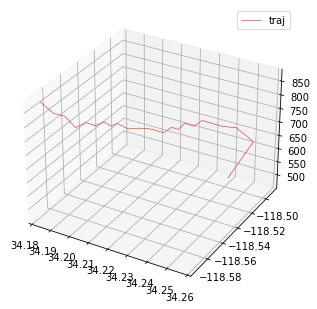

8518f2


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


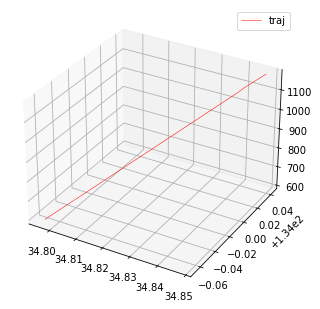

ad12e0


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


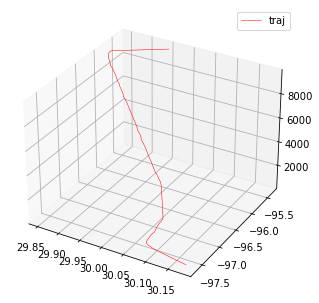

e483ba


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


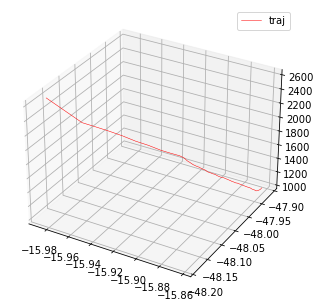

ade543


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


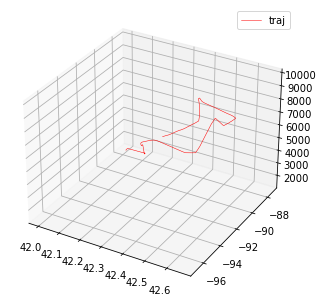

a7ac0f


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


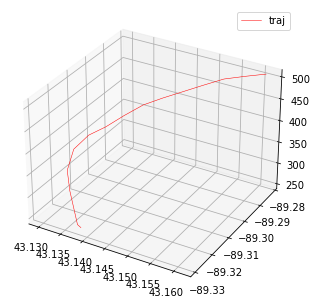

800d33


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


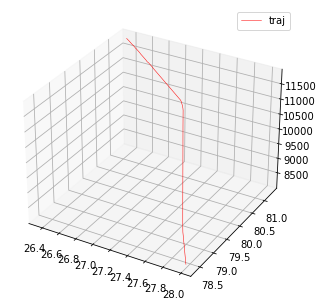

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


e4949f


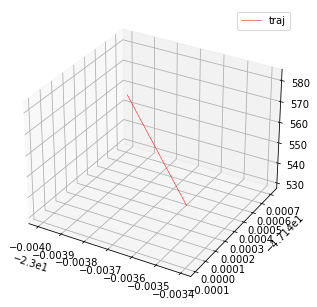

a15212


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


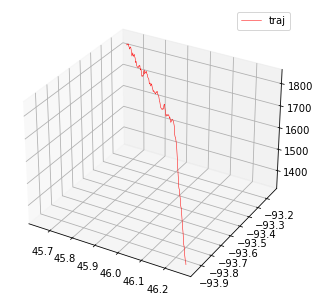

a0563b


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


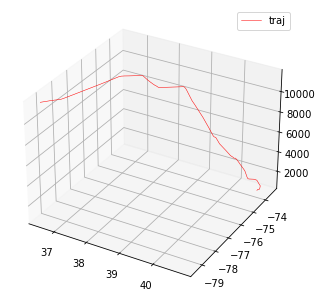

a2b7c6


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


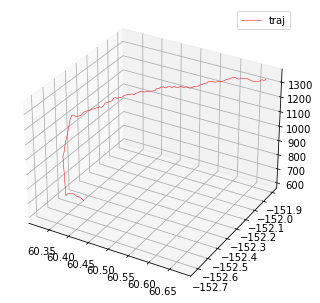

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a0acfd


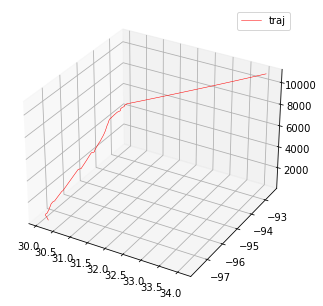

a69c64


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


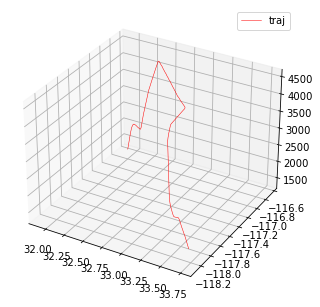

a40312


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


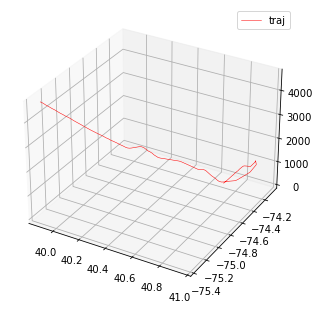

a82a06


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


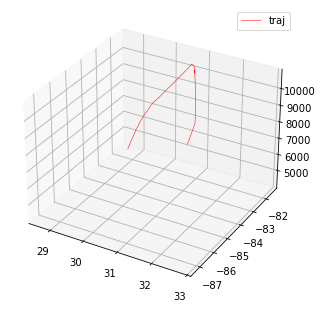

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


ac5cd7


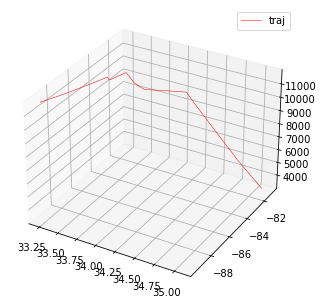

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


ad0f29


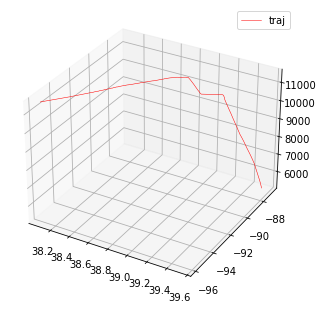

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a3ec77


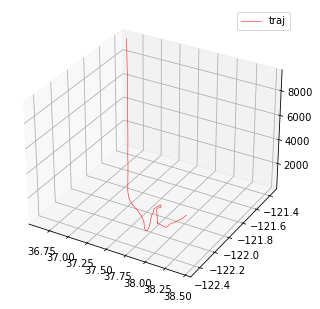

a38c95


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


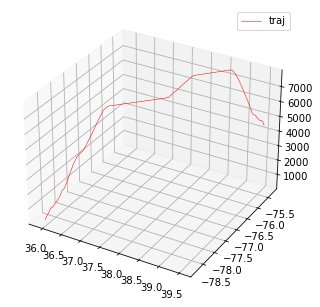

a46ad6


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


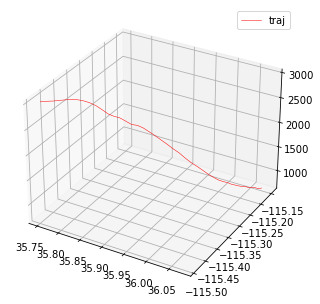

a02cf1


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


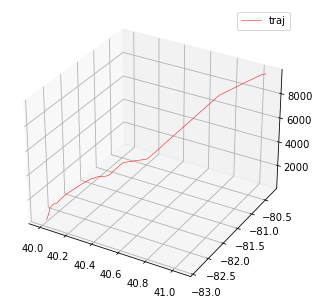

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


8013f8


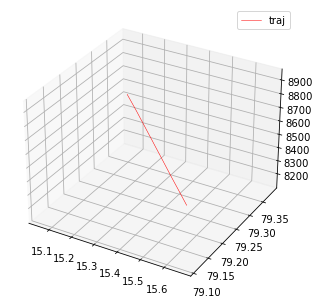

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


ad83b2


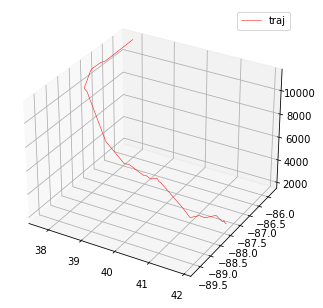

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a08e3c


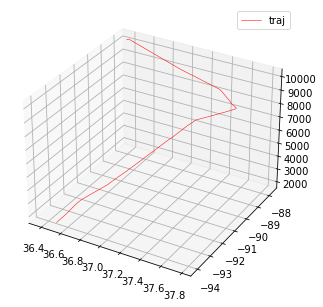

a5f162


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


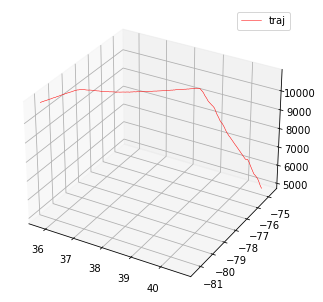

ab2fb5


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


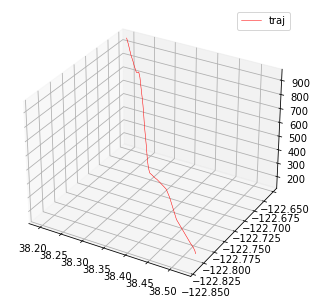

ac9e9f


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


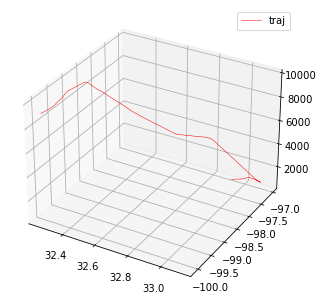

a3271e


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


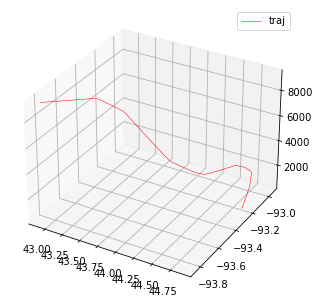

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


aaa992


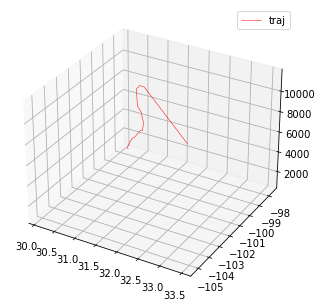

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


ab4deb


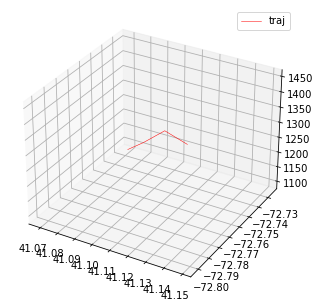

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a16068


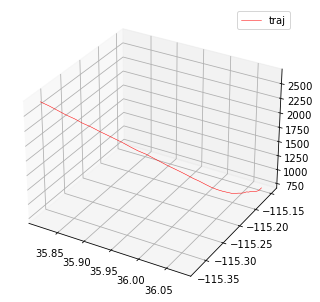

a4491f


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


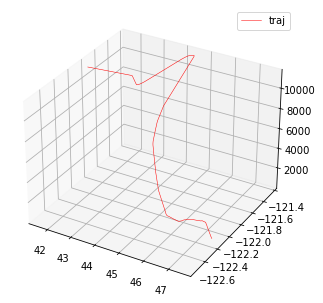

8a0377


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


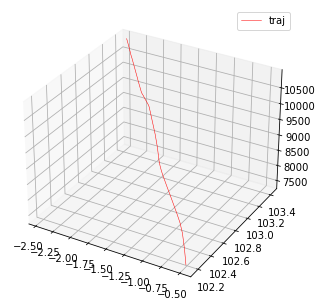

84b794


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


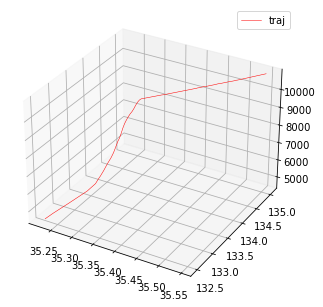

846866


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


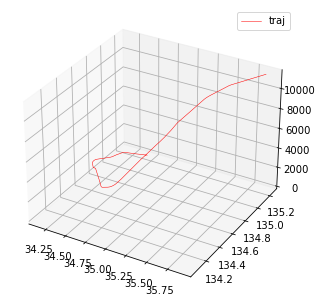

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


aa7734


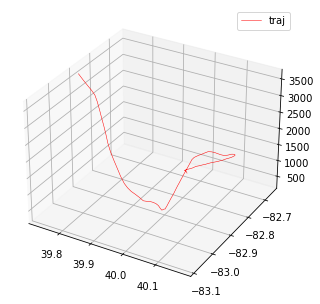

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


39c48d


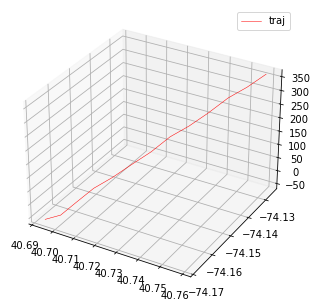

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a2bb10


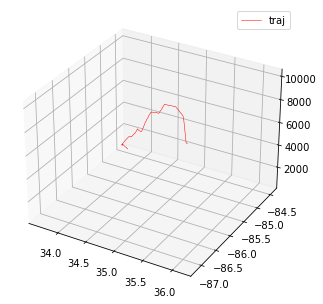

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


71c038


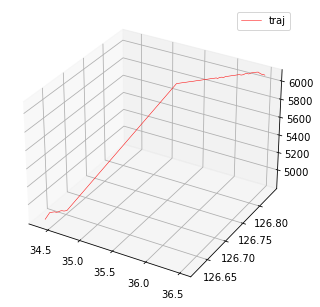

a4ec6b


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


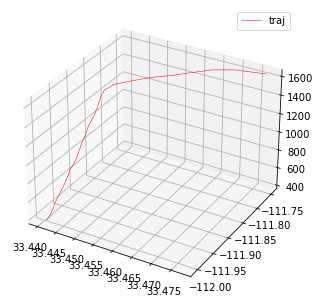

a3e55a


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


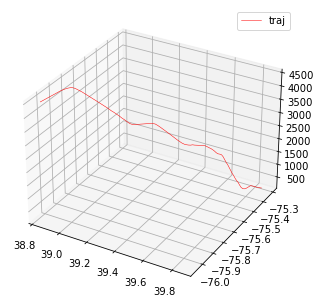

a35aa4


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


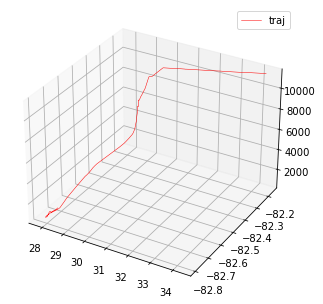

a6dc36


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


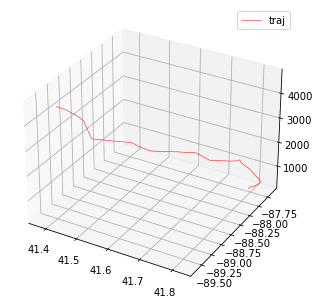

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a0d374


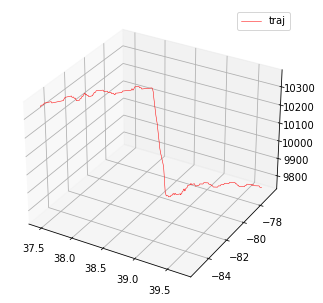

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a7d085


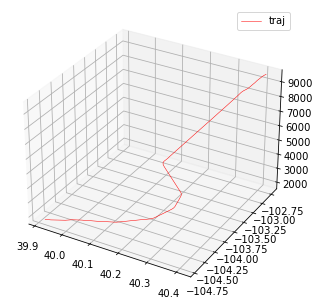

abbd2d


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


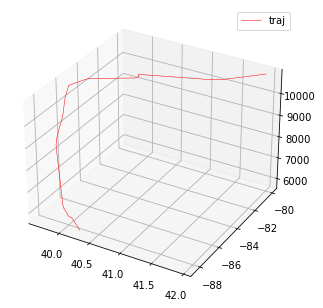

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a7ede3


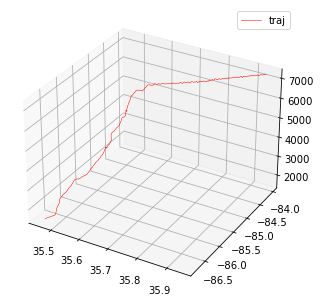

a7d771


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


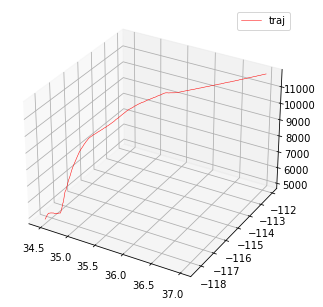

406e66


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


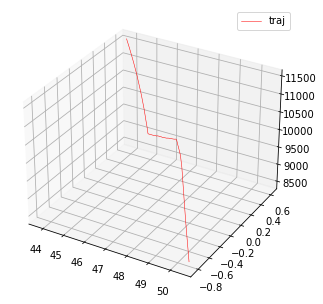

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a447cd


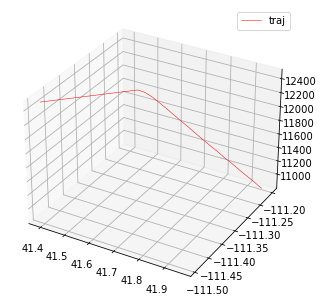

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a920f4


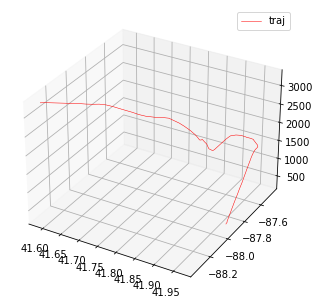

a68caa


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


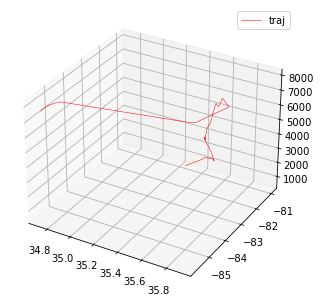

a03397


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


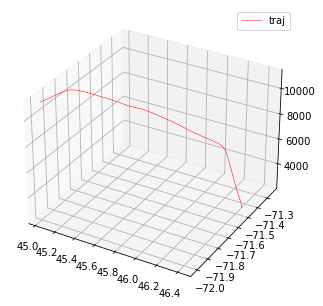

02a1b3


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


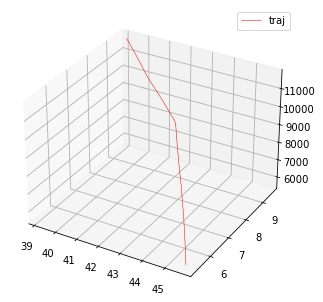

a7fed0


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


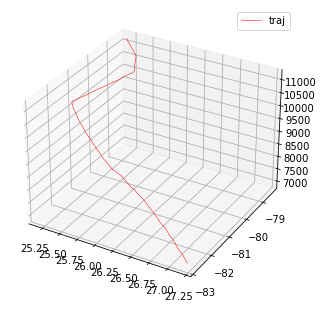

a6e72d


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


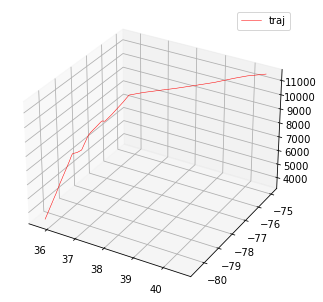

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a8e733


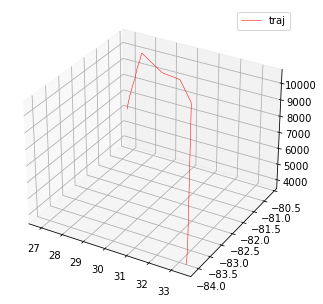

a67a34


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


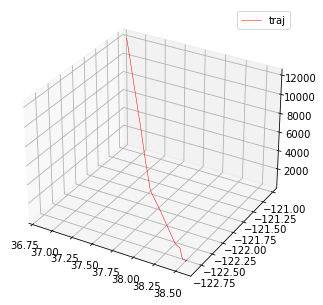

ac141f


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


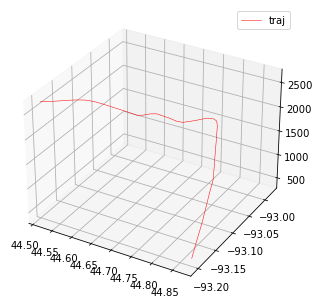

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a1e0c8


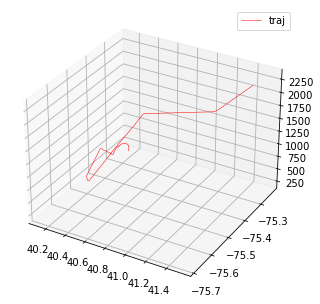

a45316


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


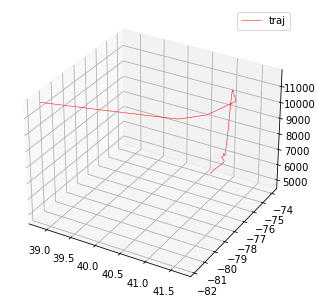

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a443d3


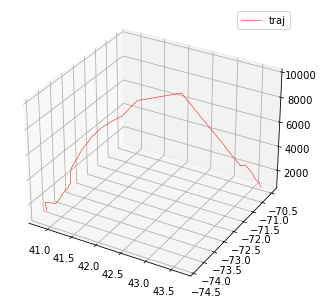

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a85c0c


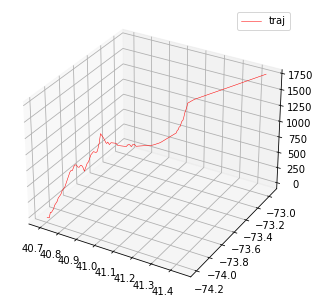

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a85f29


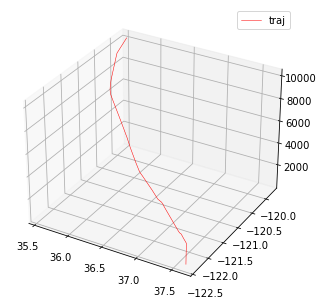

84bac2


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


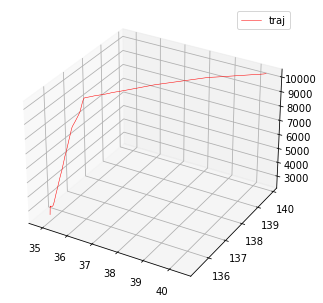

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a992db


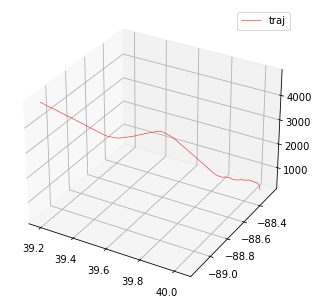

a6e376


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


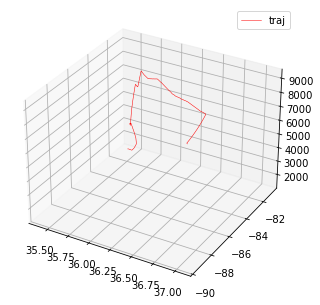

a04695


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


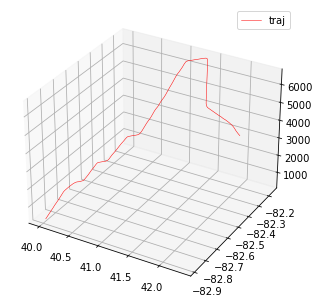

a04a4d


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


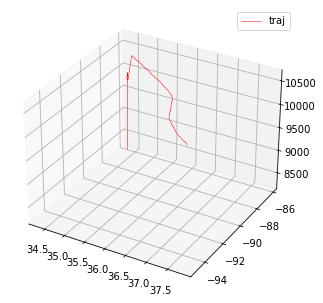

a25285


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


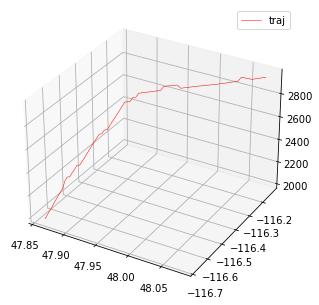

845ebc


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


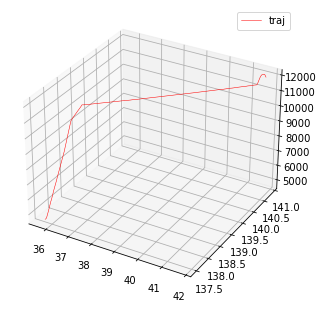

a29611


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


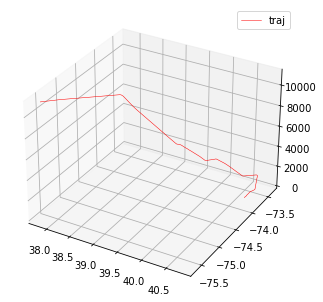

ad5b90


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


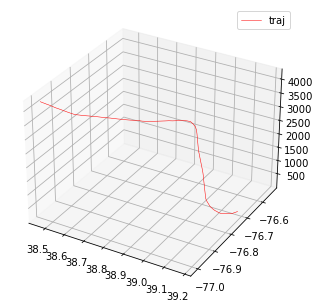

a385c8


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


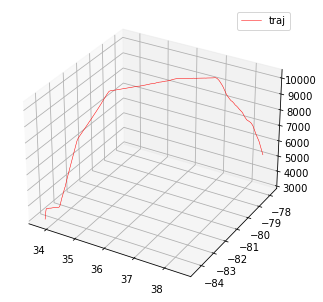

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


acab3f


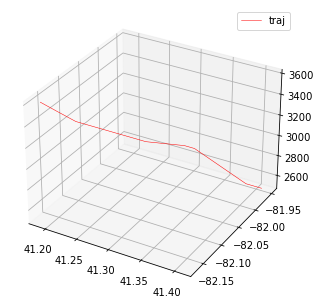

ad7ab8


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


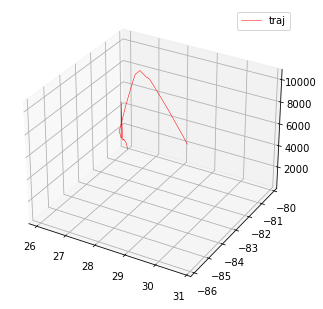

a30151


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


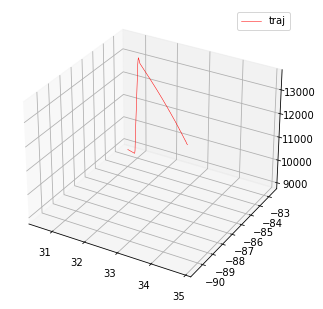

a223c1


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


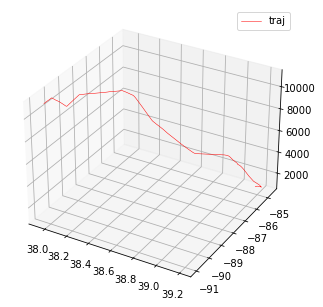

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a21d14


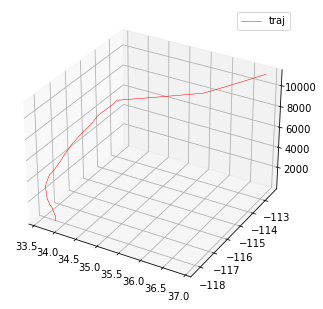

c0614d


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


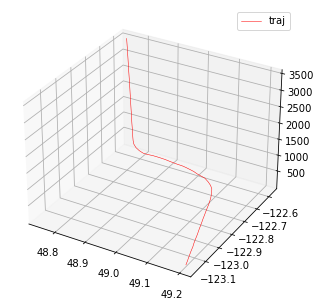

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


abc96f


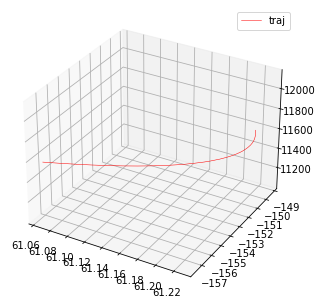

a3a235


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


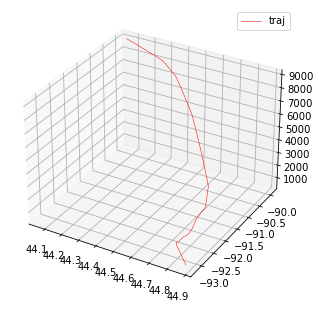

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a1f822


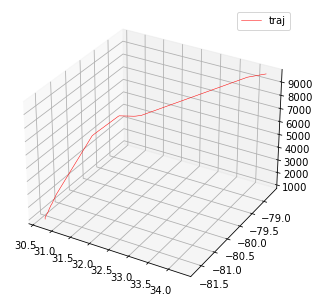

ab678e


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


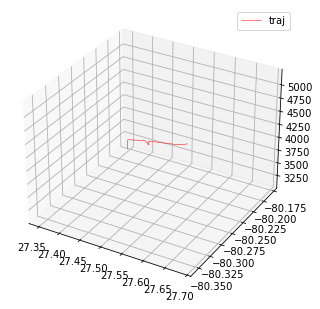

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


846adc


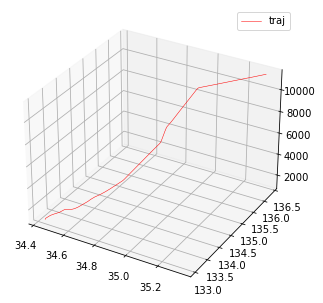

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


c02e92


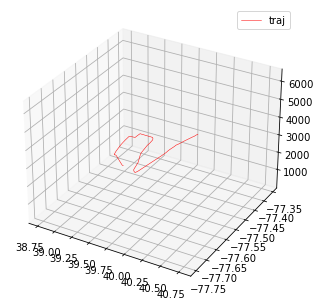

a15c80


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


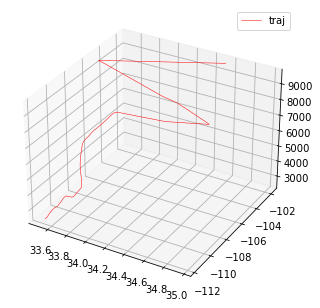

86d215


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


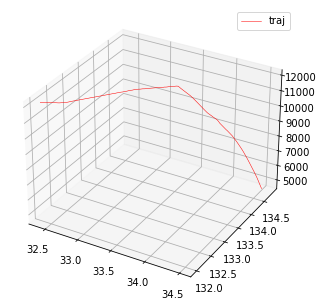

ac9121


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


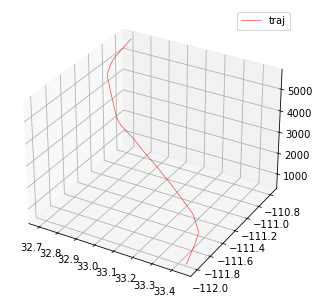

7c1ca2


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


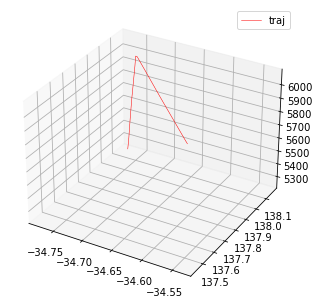

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


471f92


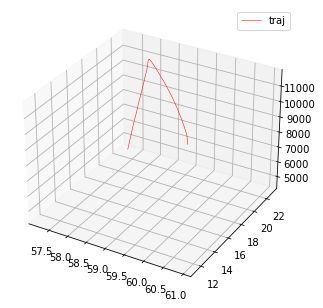

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a9502a


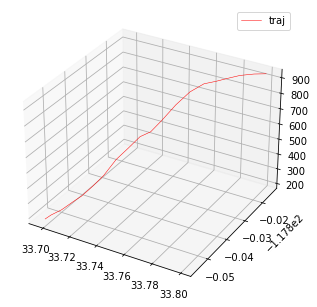

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


aa77c0


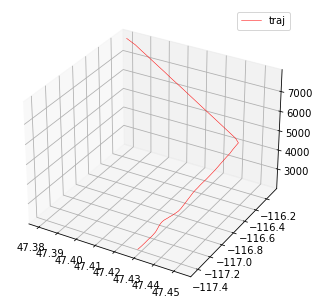

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


ac0e70


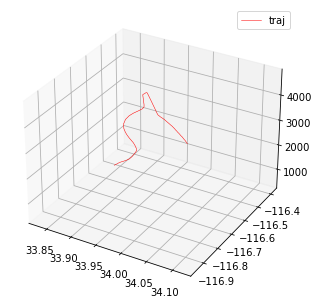

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


e48b00


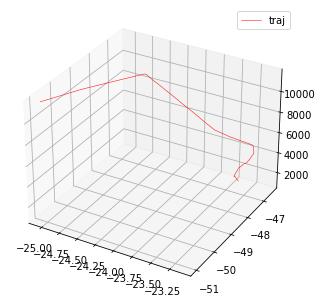

c00b9c


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


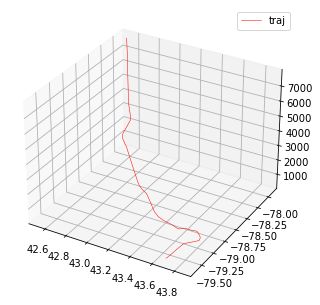

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a51b1a


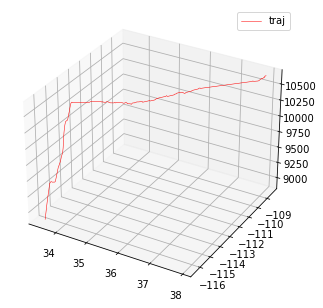

7c6d26


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


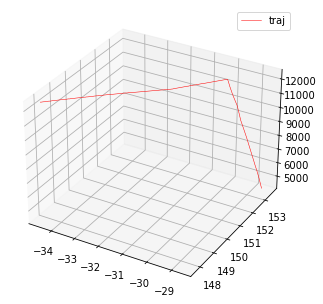

ac8111


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


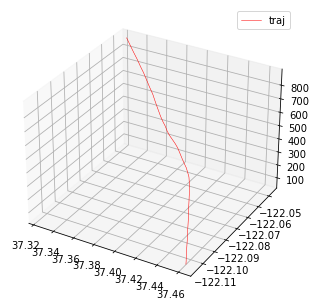

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


4242bd


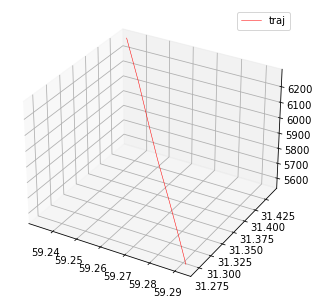

a31f99


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


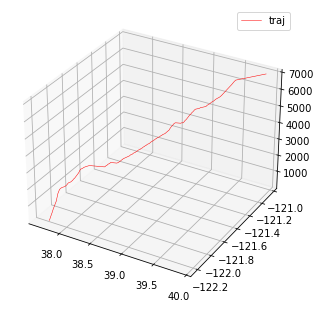

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


aa57df


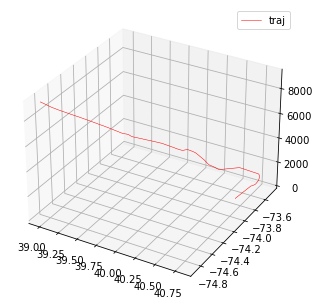

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


406d7a


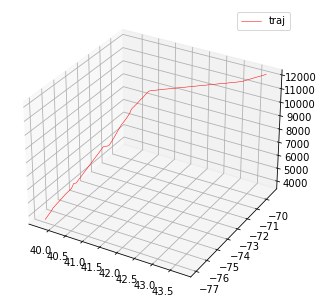

a4f9af


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


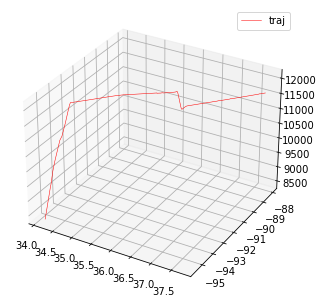

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a12625


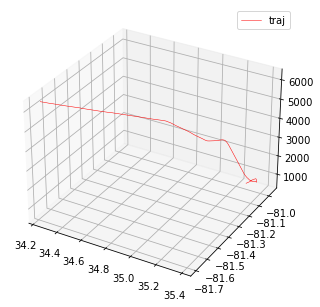

ad3e16


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


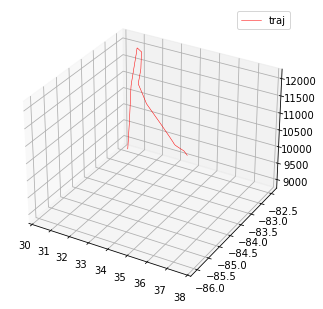

4245fb


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


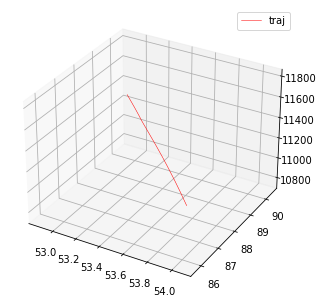

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a7f39c


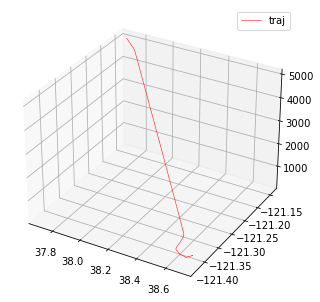

a54632


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


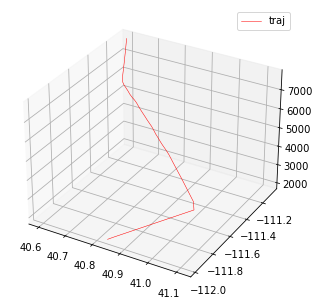

800bfa


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


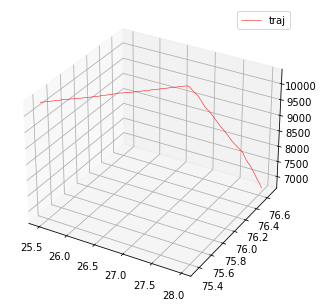

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a2d143


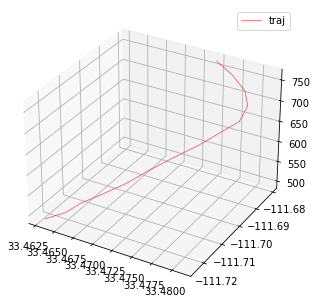

a8f728


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


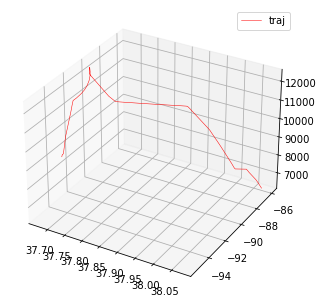

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


ac5d61


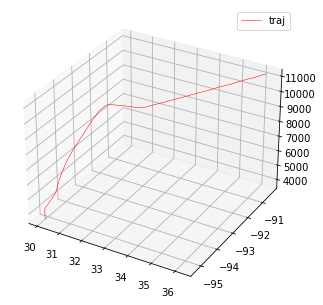

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


440102


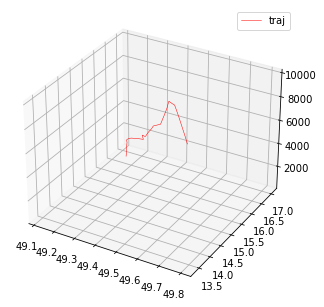

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


781073


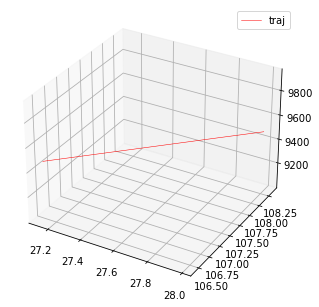

507c46


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


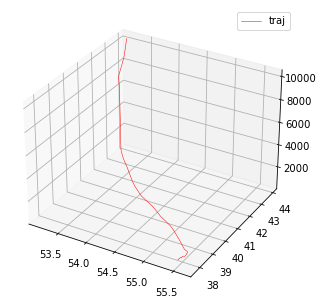

39cf0a


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


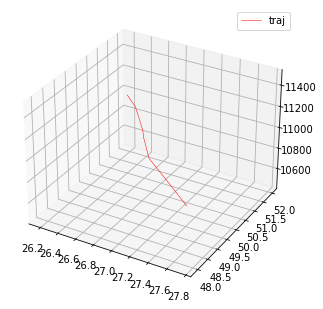

a037b9


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


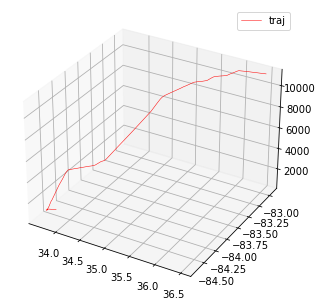

a3eb11


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


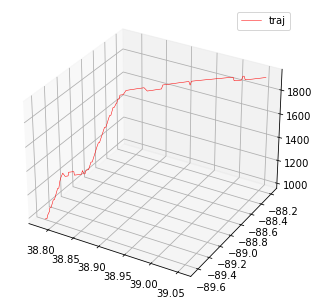

a2e93c


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


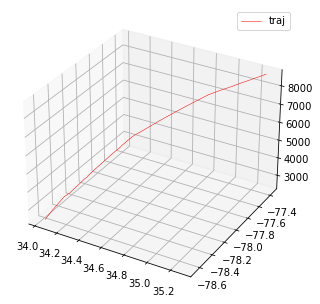

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a38d34


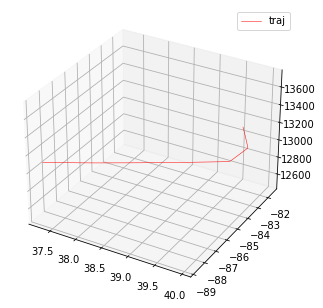

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


ab40ce


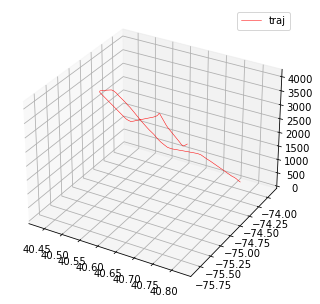

a2d6a2


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


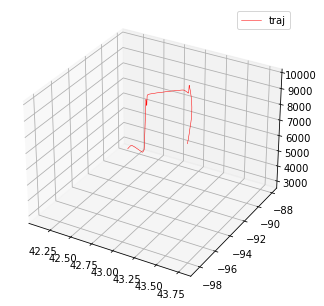

ad5d5f


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


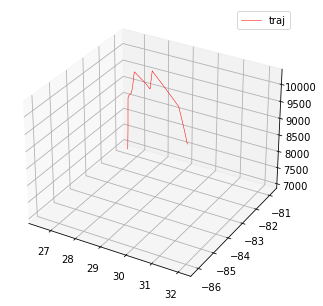

aad766


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


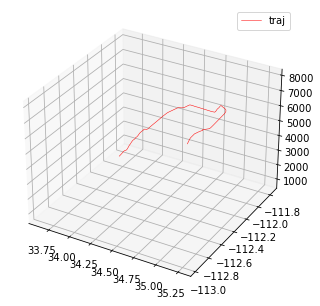

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


424344


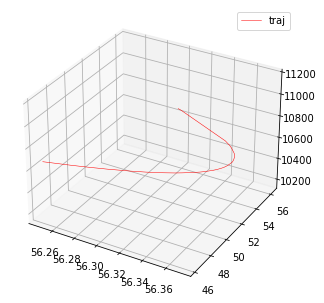

7c80fc


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


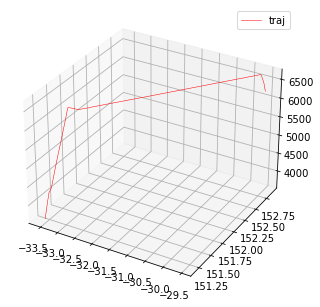

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a97aff


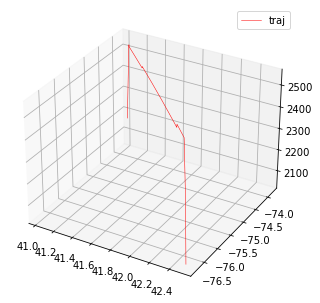

7c32f3


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


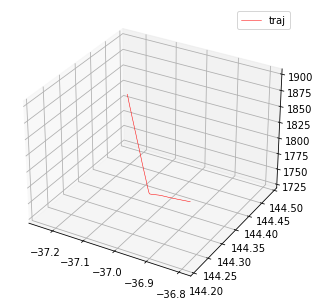

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a1bb83


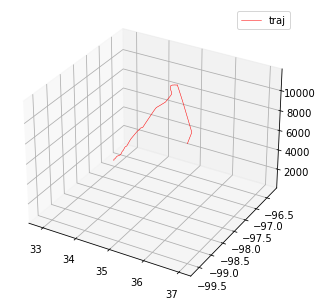

a8847f


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


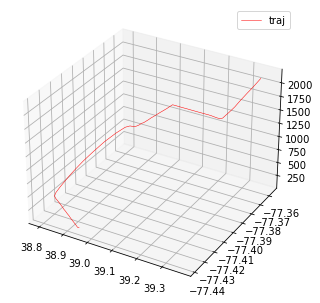

ab20b6


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


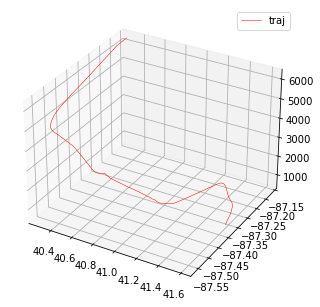

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a3a222


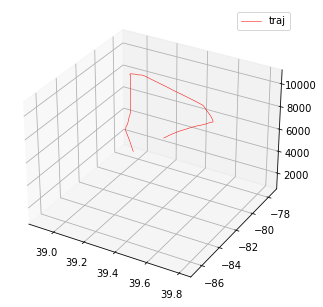

a14c53


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


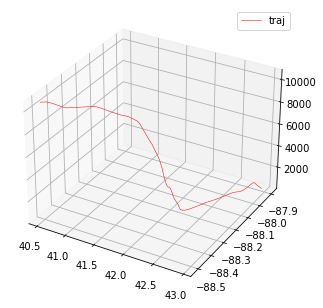

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


abdc9b


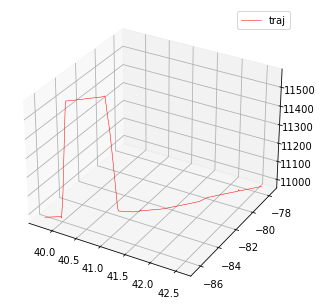

a1c0ec


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


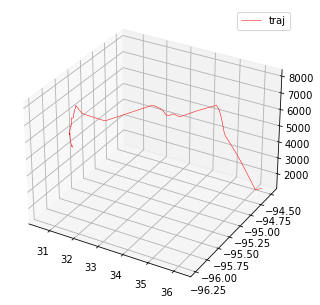

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a8050d


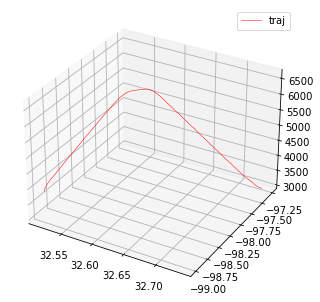

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a38d90


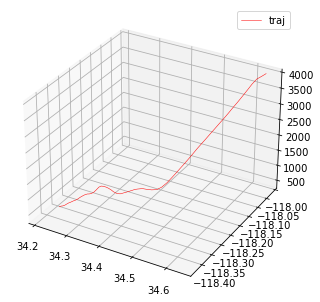

ad2fab


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


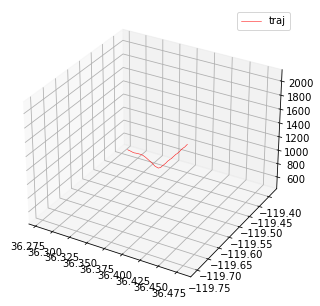

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


ac20a1


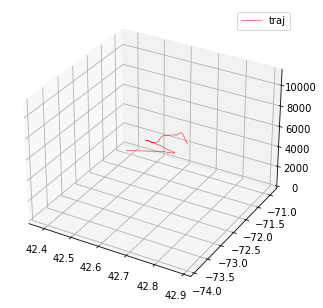

710058


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


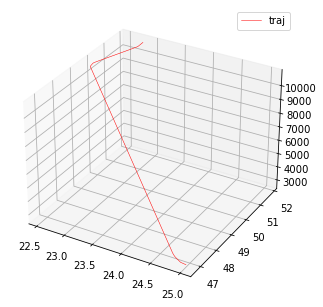

896317


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


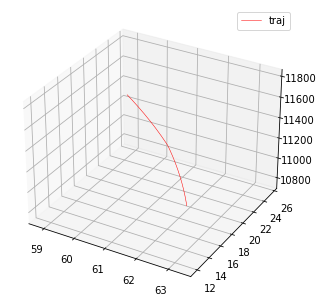

ac5371


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


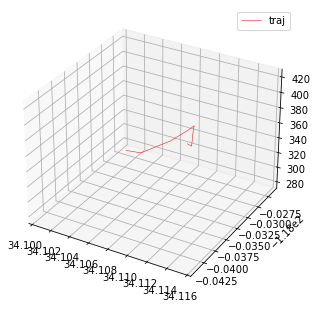

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


86d295


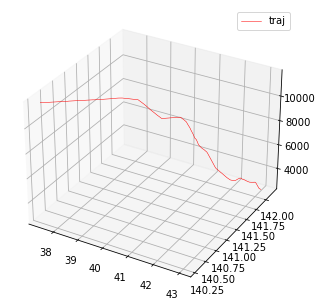

a34b10


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


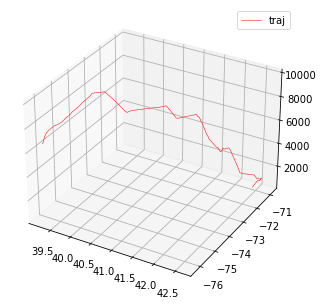

a9b088


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


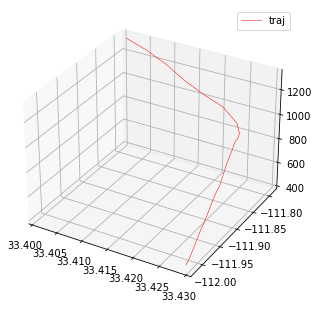

a638cf


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


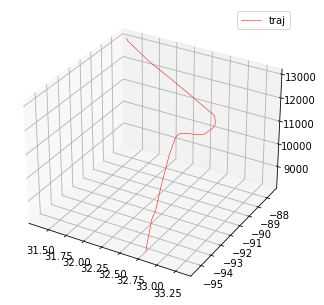

7c581d


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


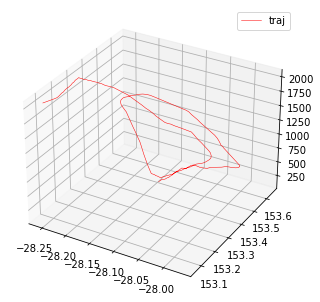

4243dd


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


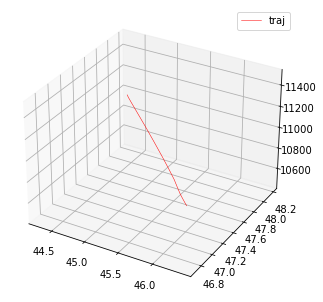

4070ec


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


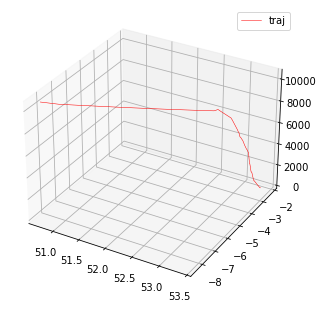

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


ad6bdc


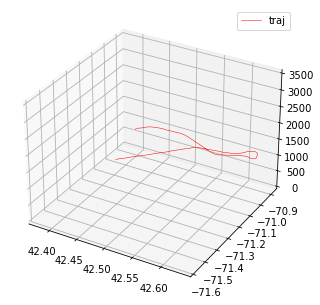

ad282f


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


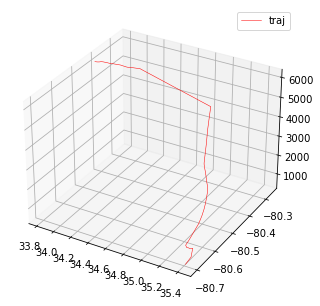

a1b573


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


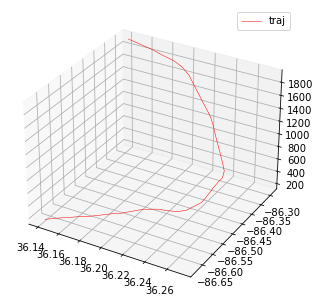

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


4caaab


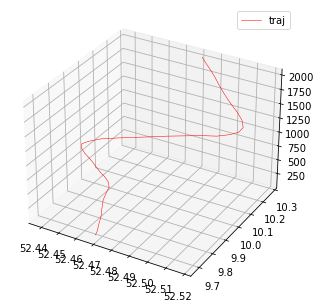

a1c5e0


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


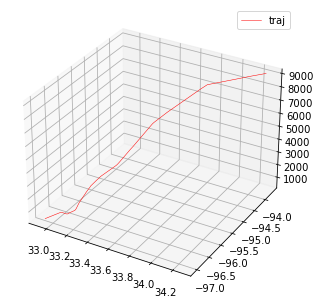

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a32fd5


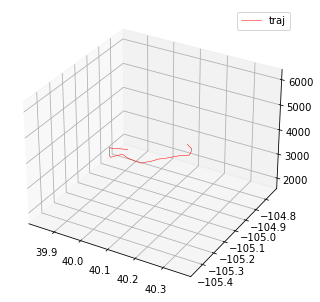

424970


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


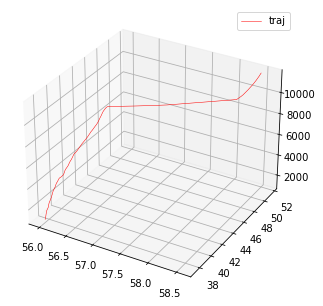

a3fd7b


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


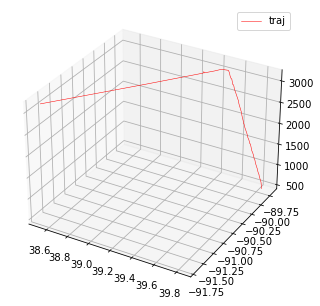

a68a73


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


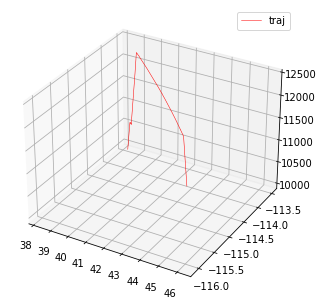

abd254


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


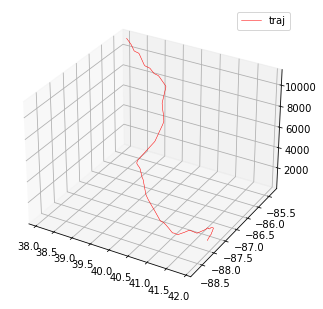

acb4c1


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


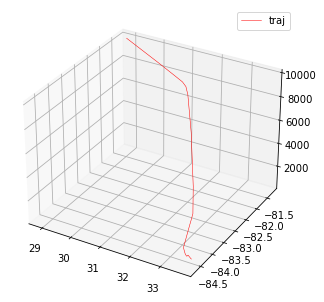

a3c15d


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


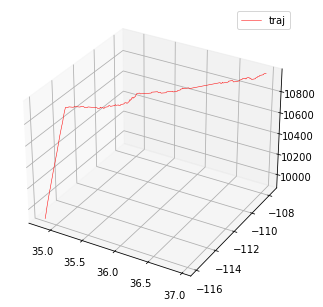

a403c6


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


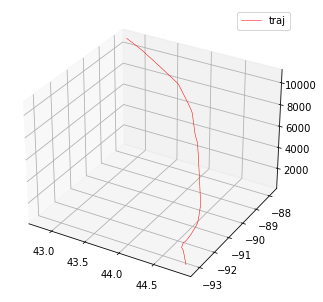

ad5dcb


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


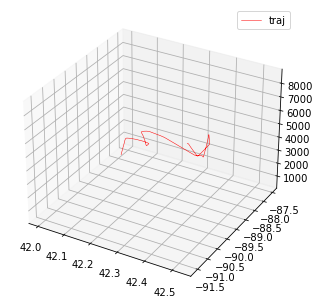

a2d44b


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


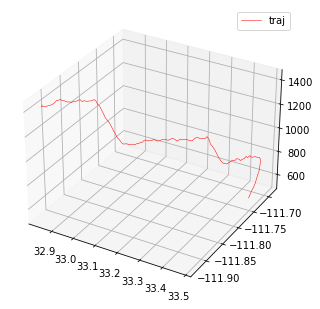

ab4af1


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


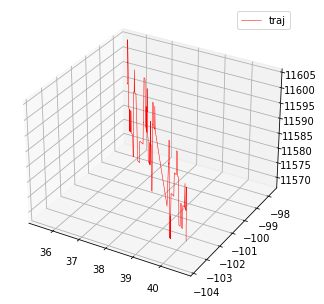

aaa96f


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


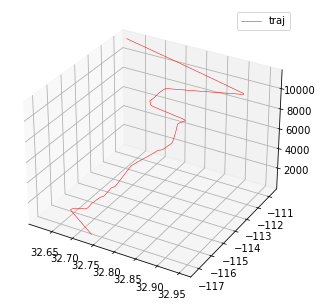

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a561fd


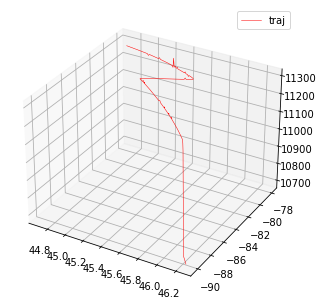

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a32861


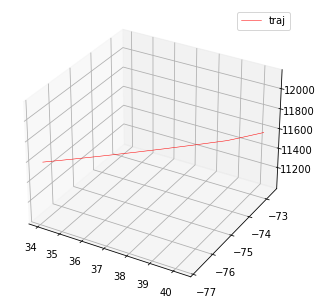

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


3949e4


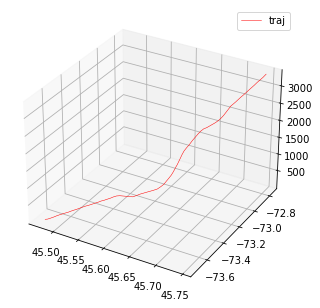

a17f45


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


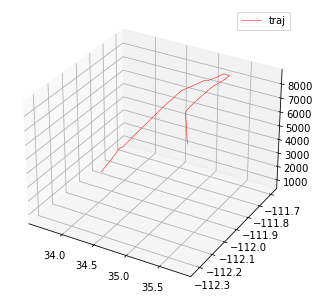

780a64


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


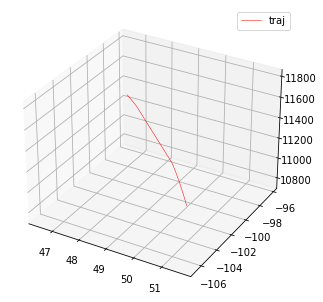

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


780a3e


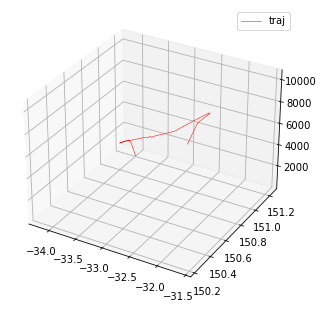

a149f1


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


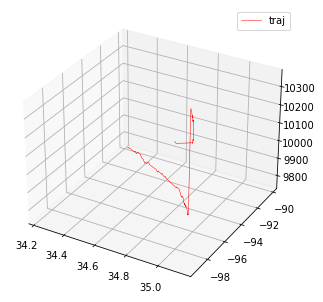

c04738


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


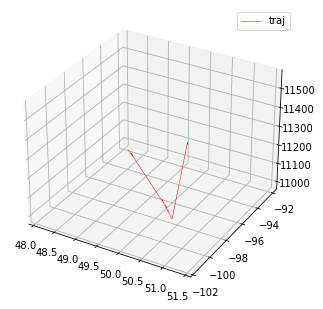

a1ba59


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


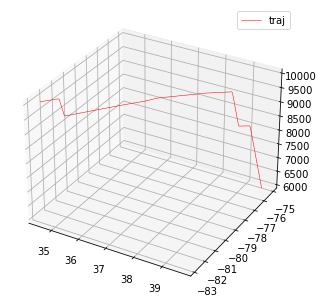

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


4d012f


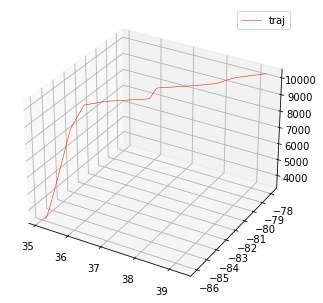

abdd67


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


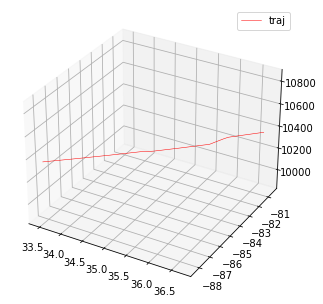

471efb


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


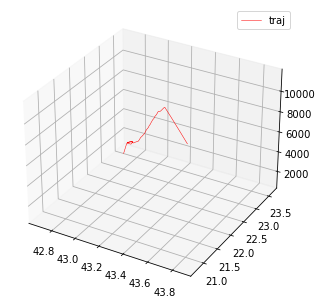

a0ac93


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


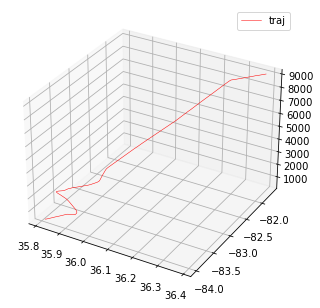

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


c00b80


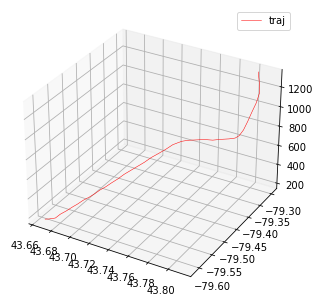

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a8e1cc


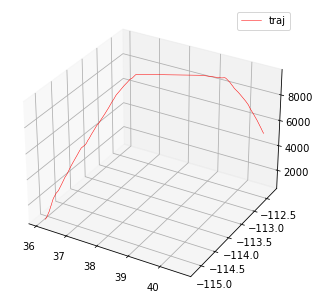

4bce04


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


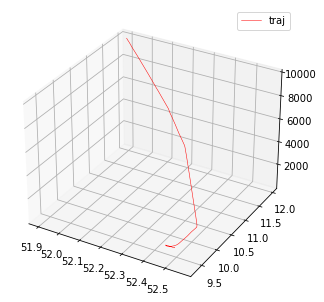

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a0d64f


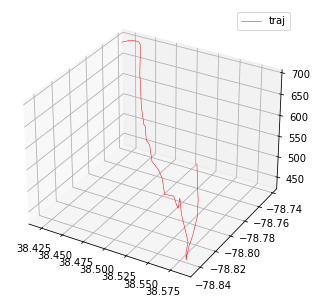

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a01bbc


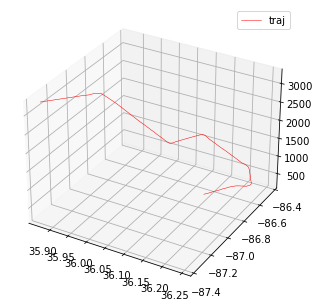

abe621


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


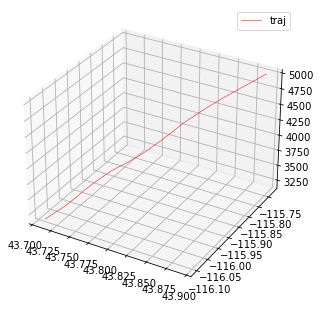

846def


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


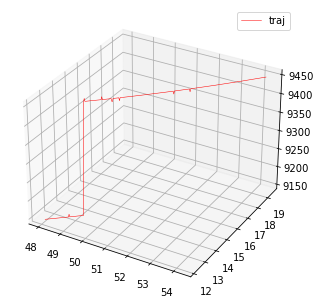

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a94b02


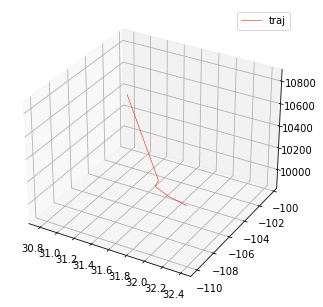

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


aabd56


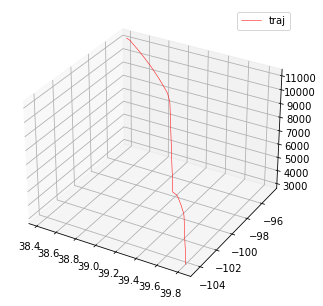

ad08bd


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


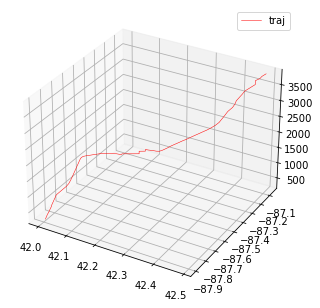

abdc91


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


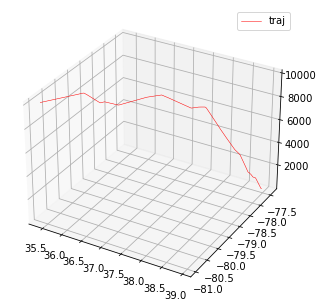

4408ff


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


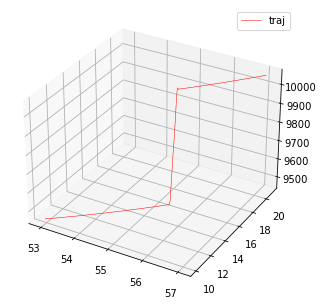

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a675ed


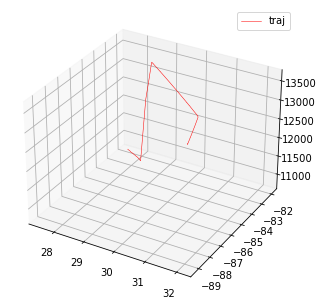

a50a88


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


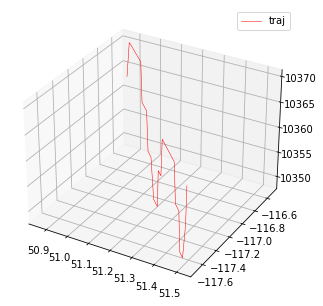

a7f4d7


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


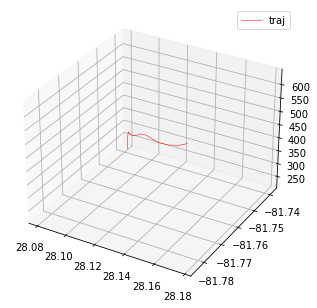

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


ac058a


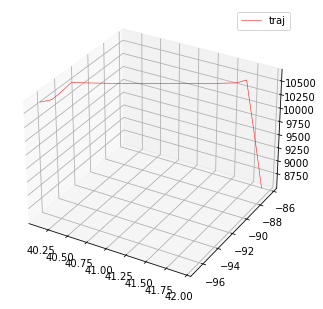

a1fcf9


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


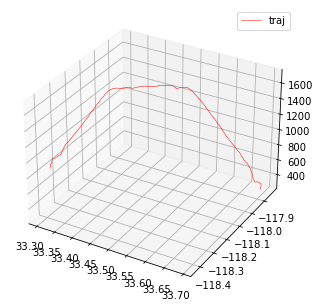

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


c06644


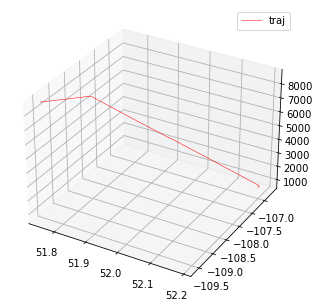

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


8005f3


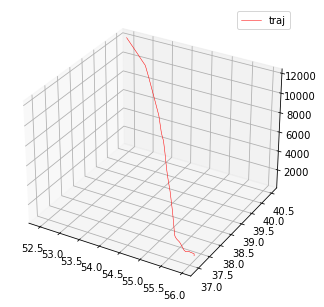

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a105e8


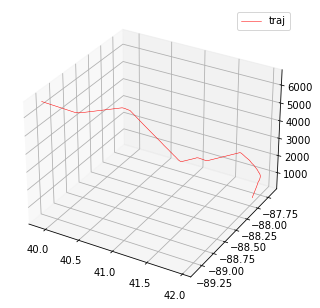

a2fad8


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


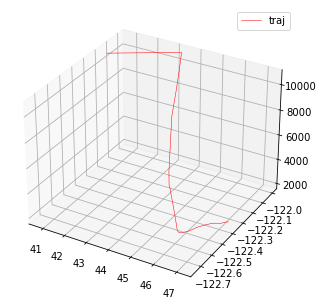

adaad1


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


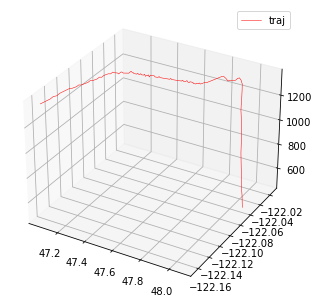

ab77ee


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


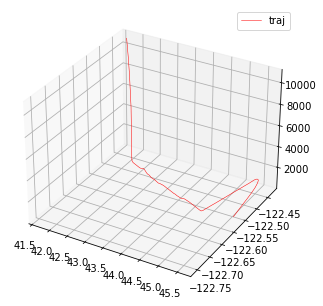

a96c96


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


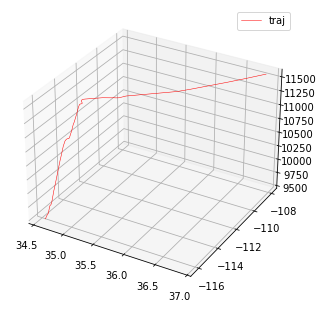

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a857c2


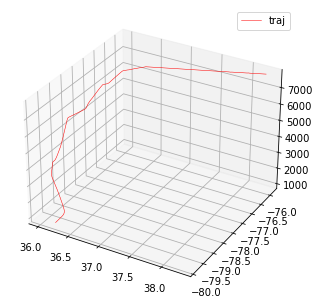

abbb77


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


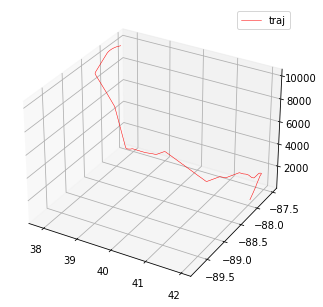

39c495


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


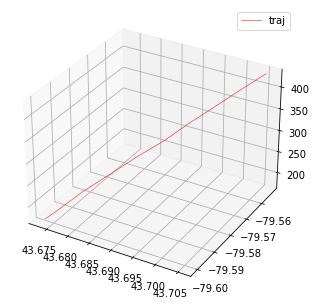

a95d8f


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


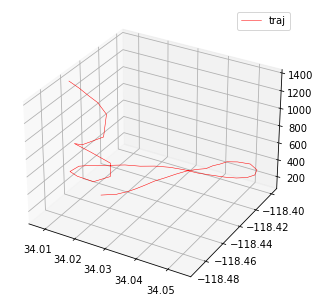

adba37


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


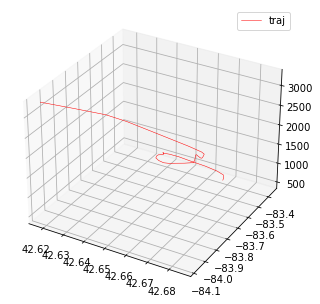

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


4ba892


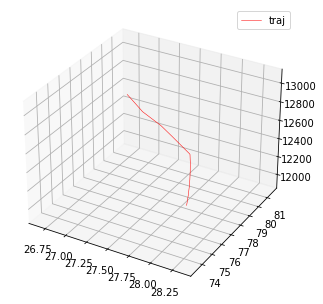

c008fd


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


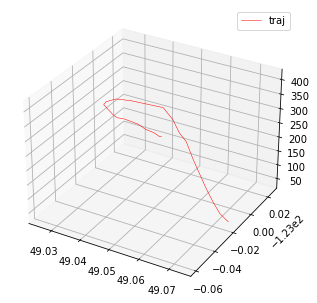

ab15c2


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


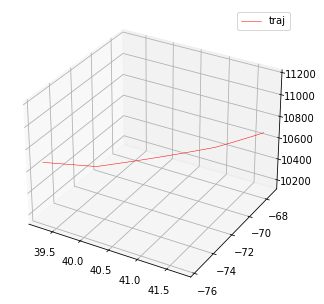

a64db9


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


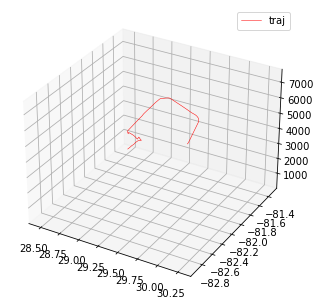

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


aa3ae9


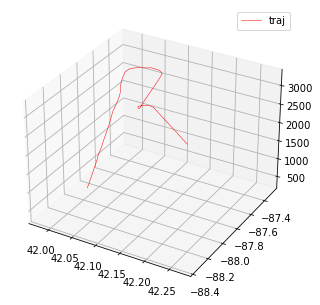

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a6873c


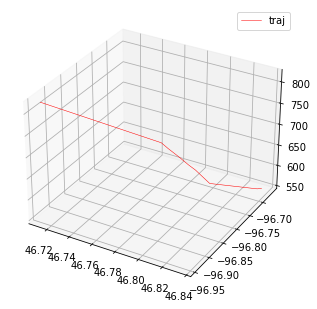

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


aaa5ae


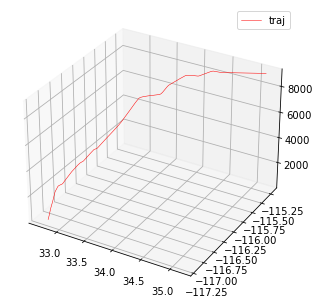

8991ab


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


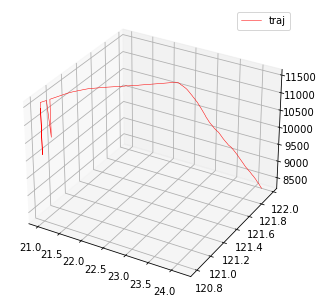

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a07177


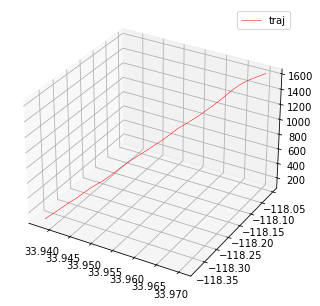

a2725d


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


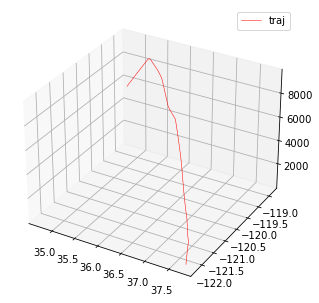

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a1383c


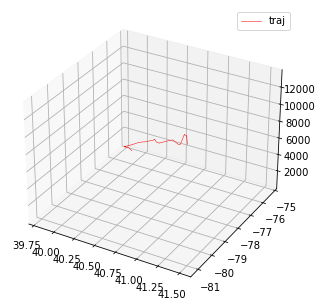

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


406e11


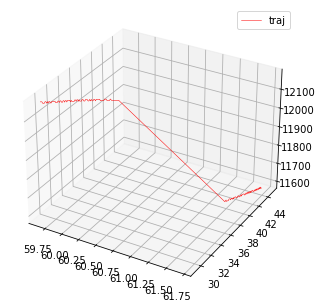

7c7f5a


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


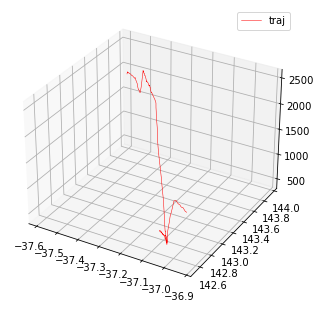

a272b8


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


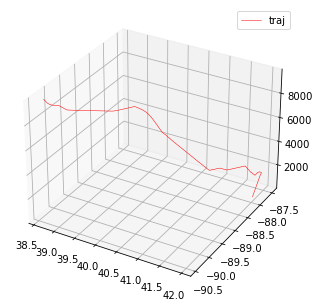

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


7c77f4


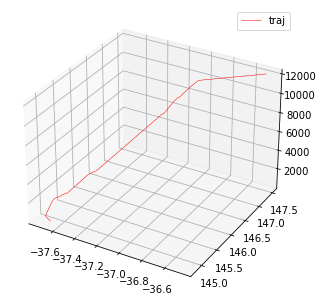

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


aa44ac


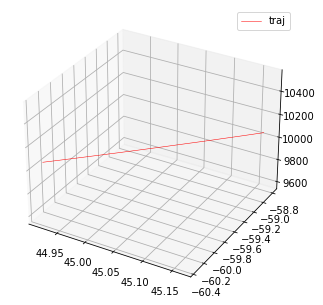

ab24f7


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


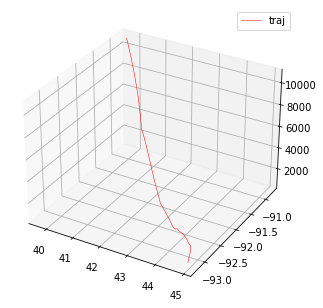

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a28904


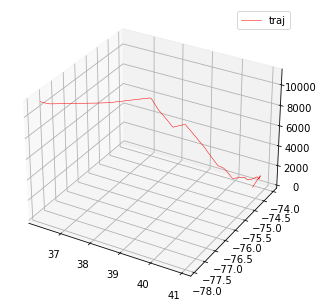

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a2d6a9


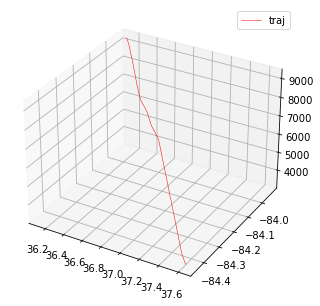

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a87942


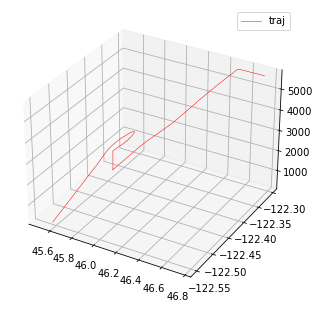

ab48bf


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


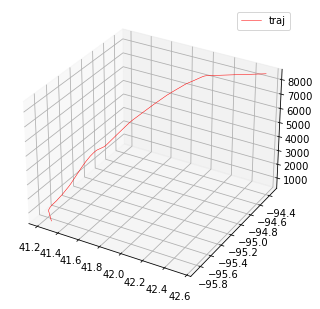

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


45ce4b


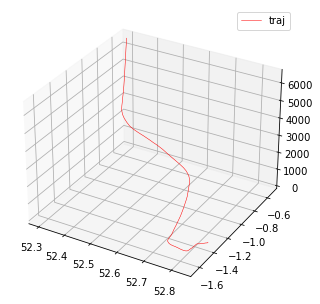

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


aa05f6


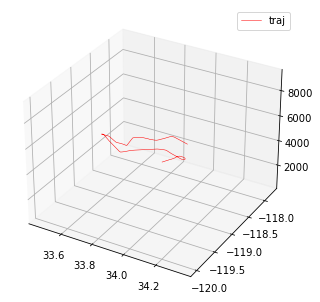

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


abc07b


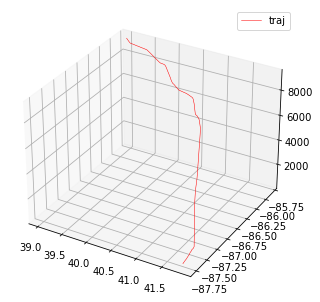

781921


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


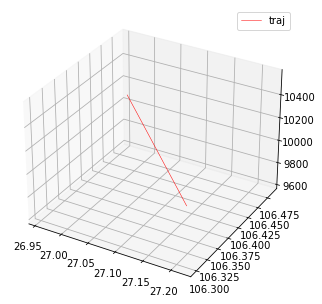

8880e2


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


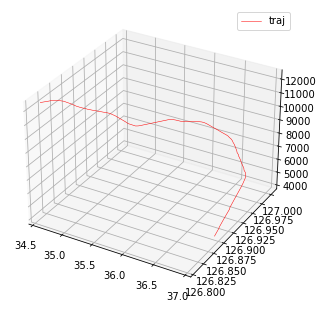

a6d1e2


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


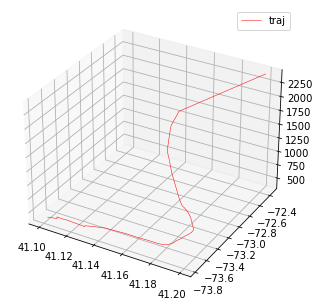

ab4e94


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


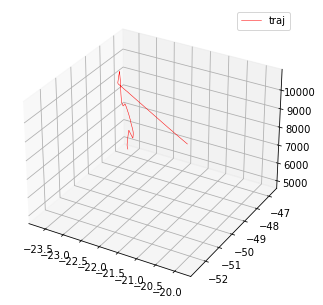

c05e9b


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


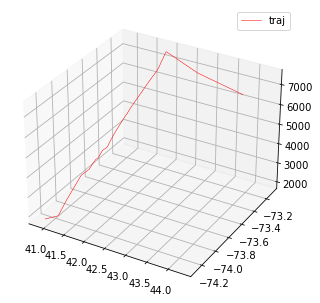

49d3d6


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


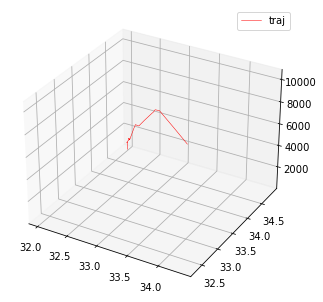

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a6c46f


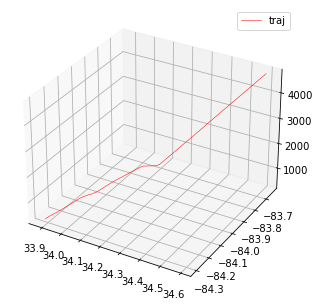

515309


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


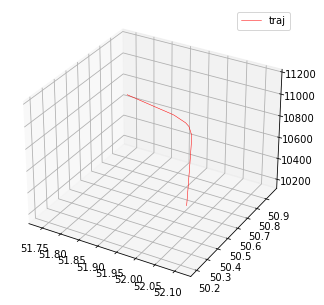

504e68


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


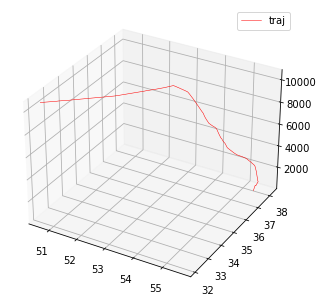

a332e6


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


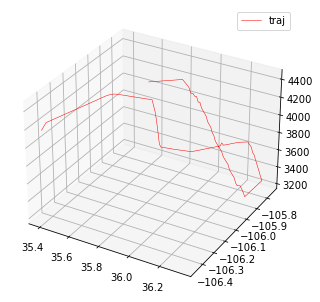

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


aaaddc


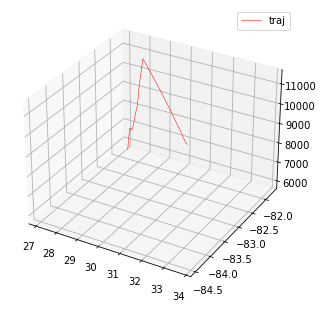

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


4bb186


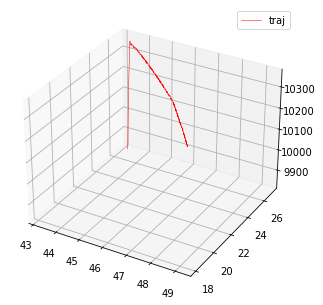

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


e48275


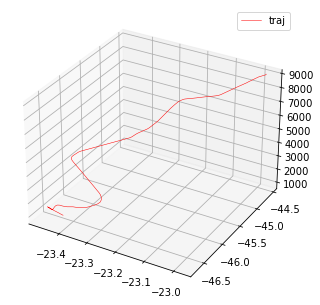

ae638d


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


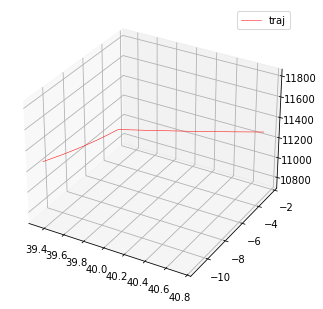

ae596e


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


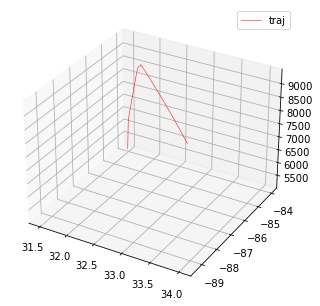

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


ac769b


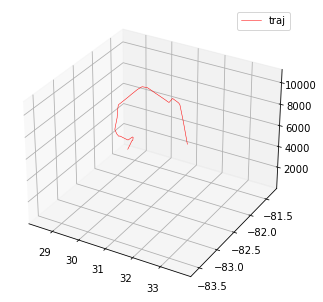

a9819b


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


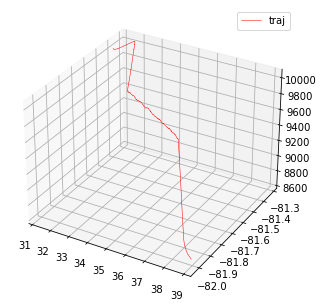

a10d7f


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


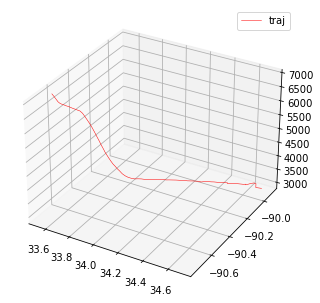

a0e7ed


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


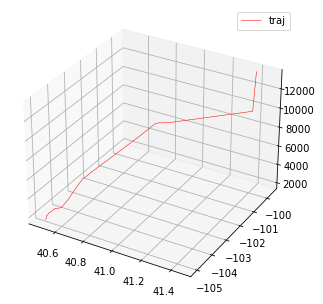

a4dab6


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


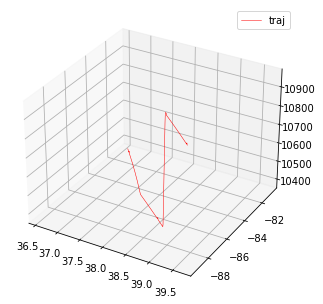

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a033f9


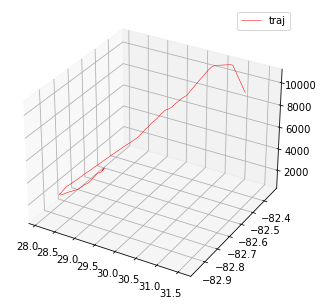

4ba94d


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


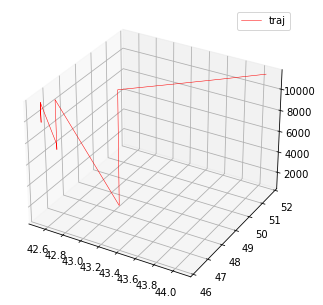

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


800c68


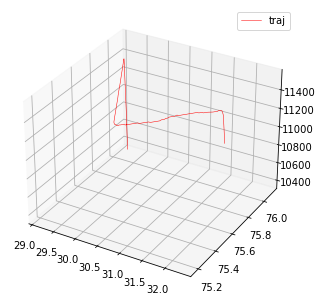

a8df2c


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


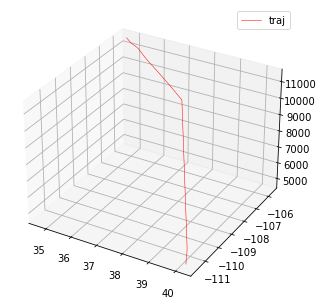

a6d34b


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


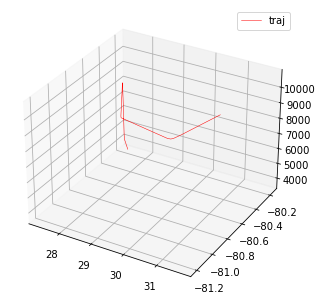

ab19fb


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


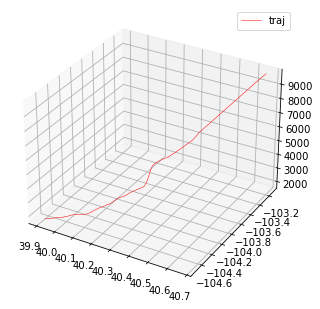

aa017c


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


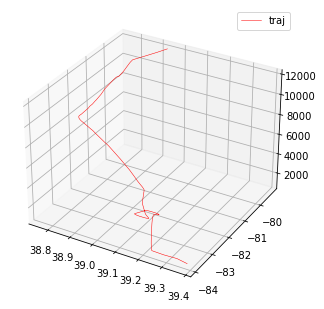

a3db5e


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


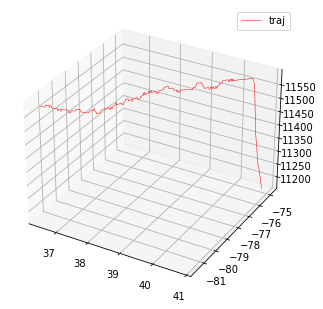

a72e1b


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


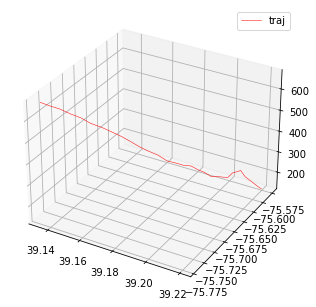

ab52a2


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


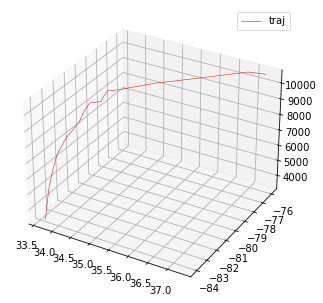

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


ac4507


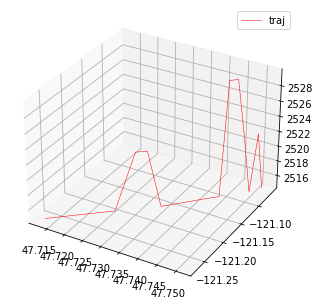

ac7aa9


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


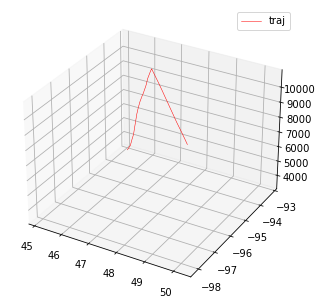

4404bd


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


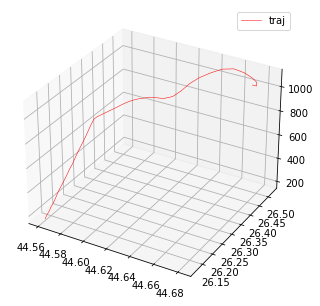

c080a5


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


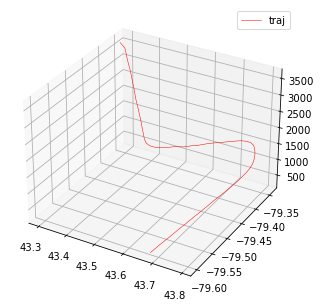

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


adeddd


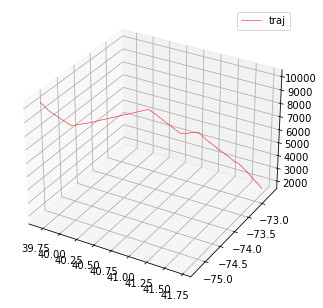

a39d95


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


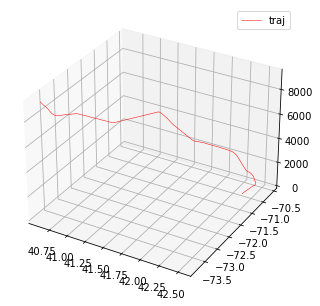

a1bd46


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


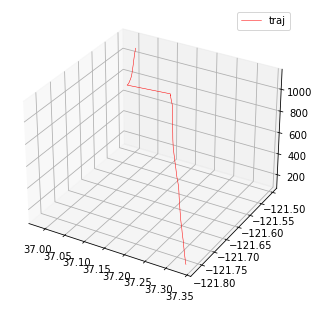

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


abbd73


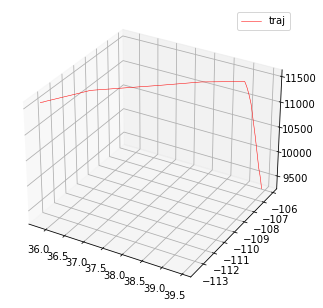

c07fb1


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


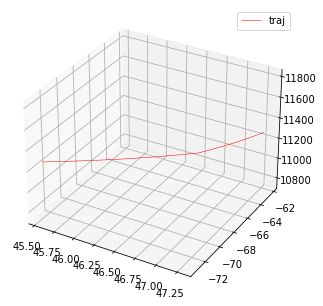

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


4892c0


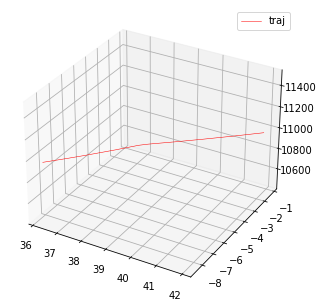

ab10df


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


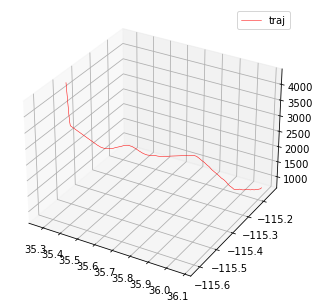

ad8b20


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


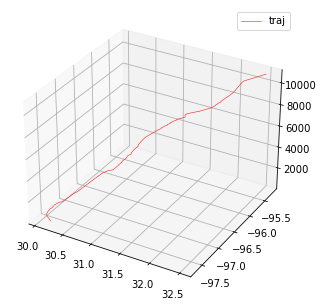

aa9d1a


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


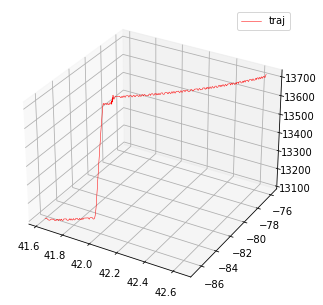

abe19d


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


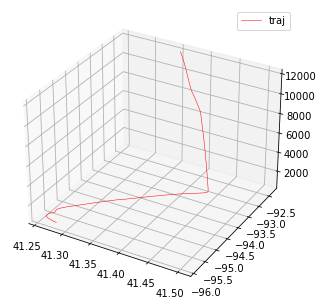

a50bea


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


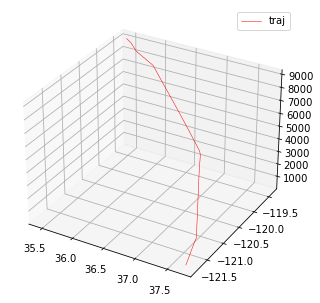

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a4bd24


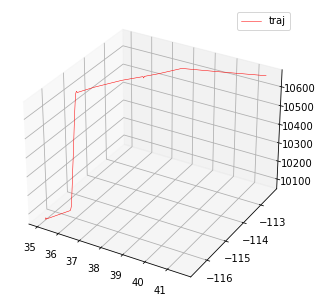

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a41c50


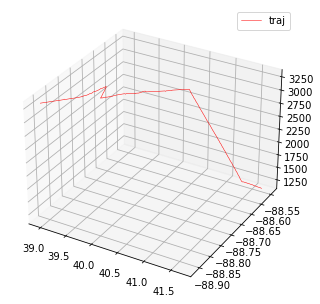

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


acdde3


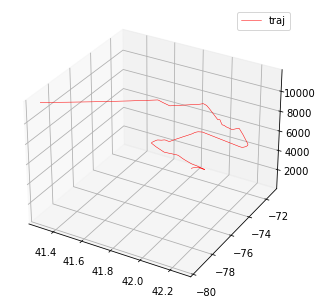

440002


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


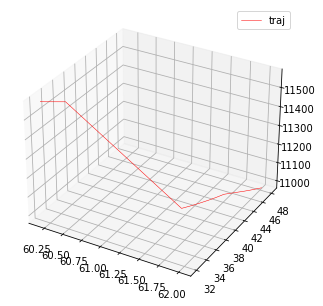

ac8b2e


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


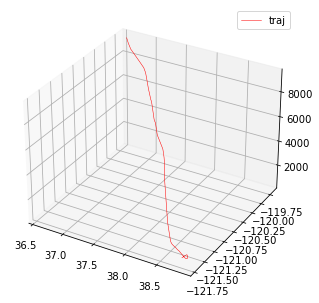

c0336d


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


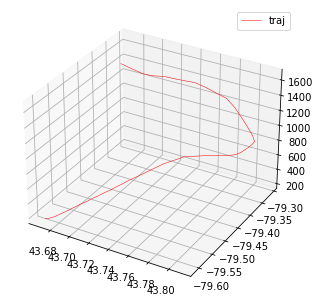

040087


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


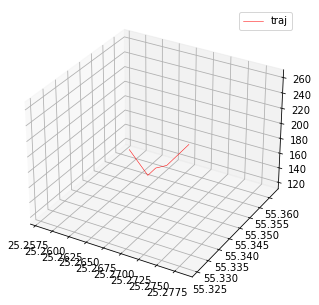

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a77ad8


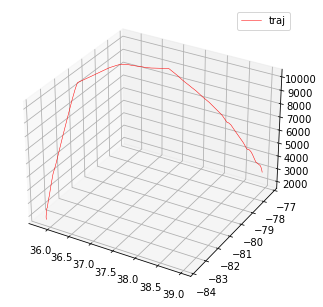

a58a29


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


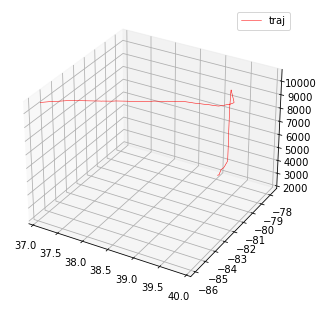

48412b


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


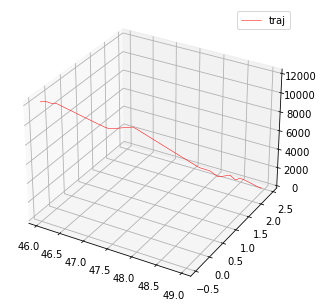

a18194


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


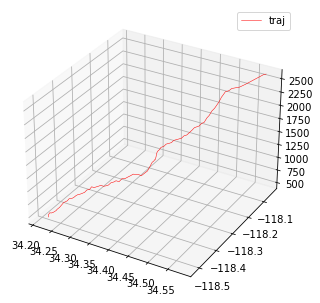

aa7e36


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


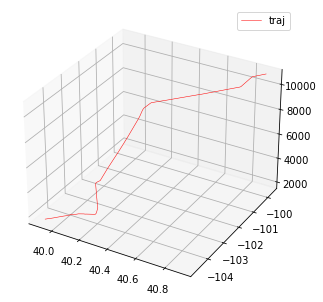

4ba914


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


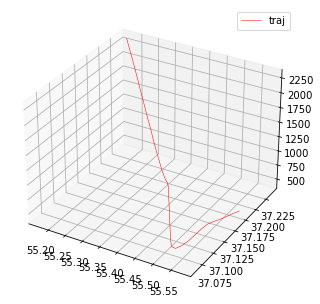

ae4e17


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


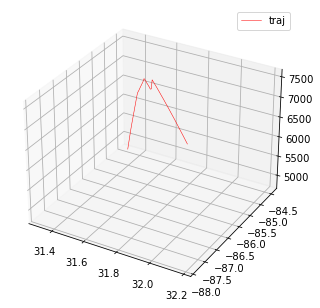

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a9c151


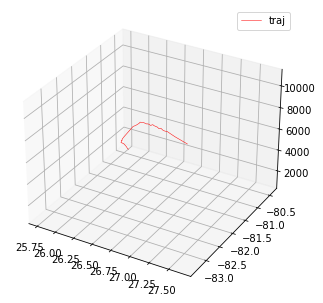

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


abf057


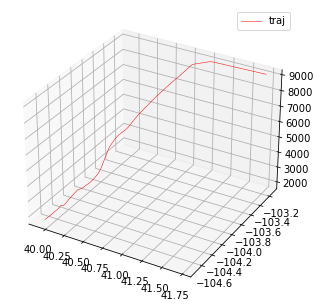

42454d


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


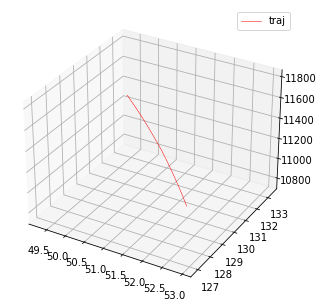

a1f5ff


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


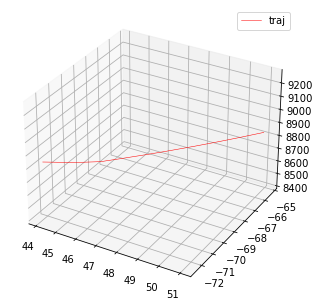

aca248


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


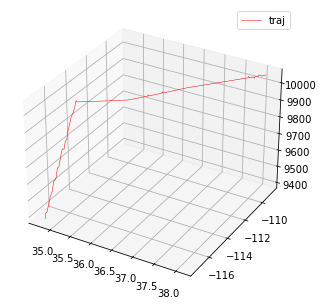

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


accd09


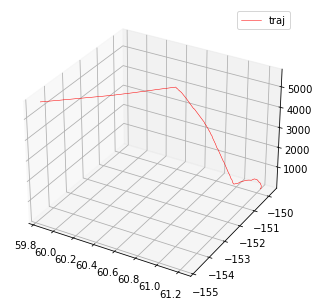

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


aca20d


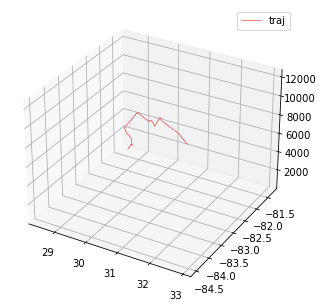

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


acfd29


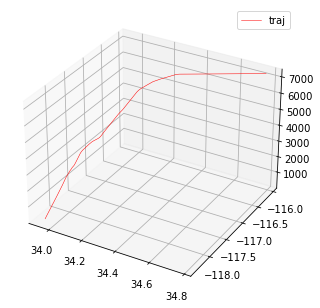

a5c927


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


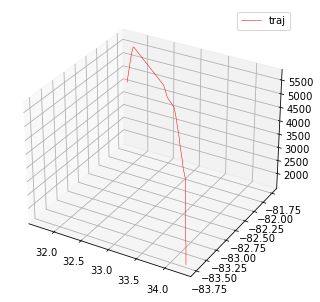

e49314


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


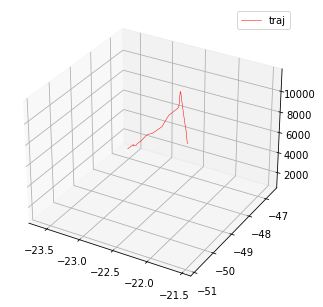

a86a66


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


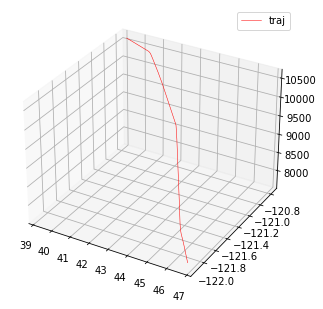

ac741c


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


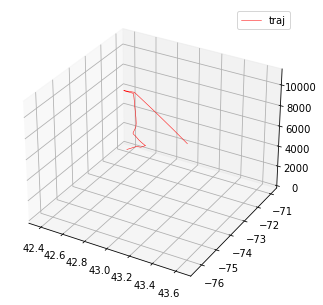

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a88819


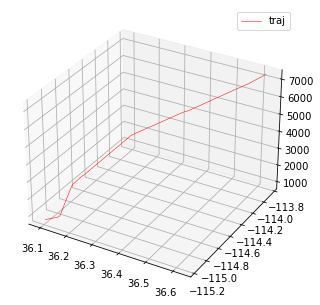

a89f62


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


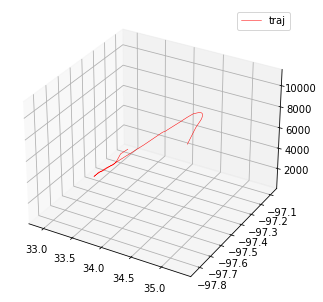

ad3d1f


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


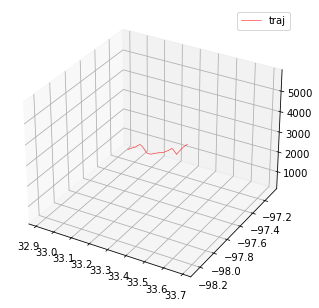

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


7c81d8


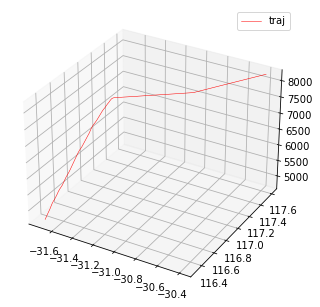

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a71f24


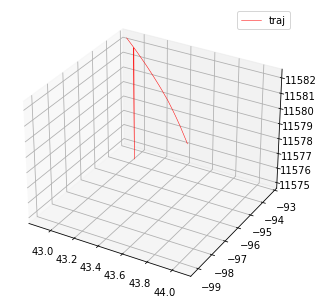

ac4963


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


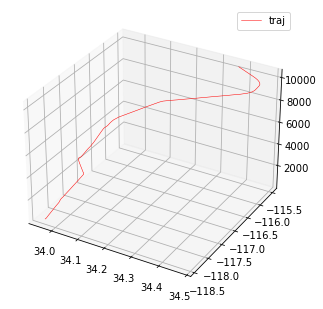

a9bf32


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


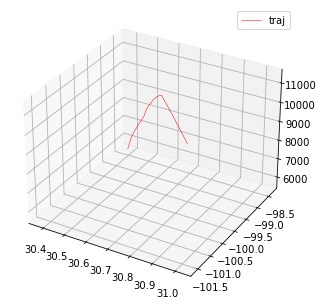

a1f46b


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


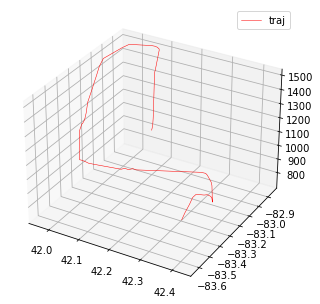

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


600b21


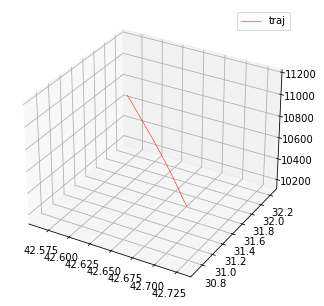

4ba9c1


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


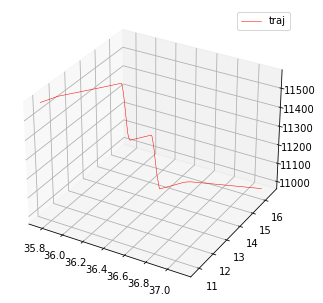

a89a9a


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


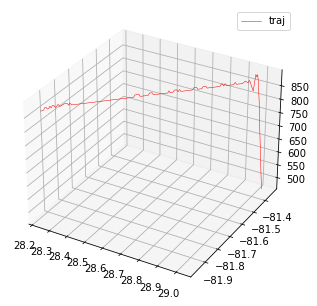

ac77d0


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


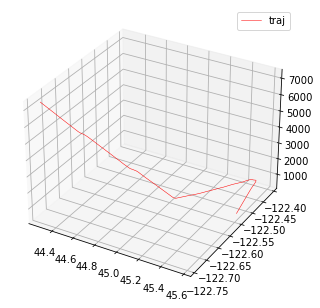

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a99df4


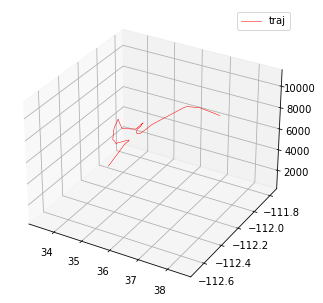

452086


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


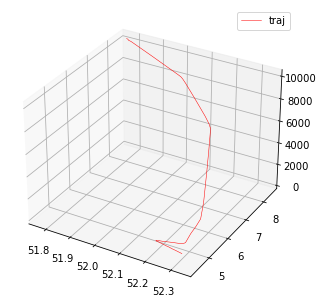

a00b98


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


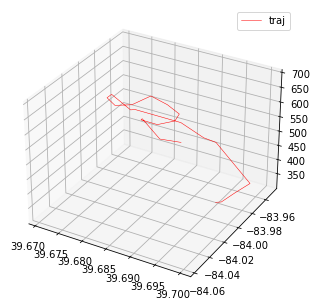

a16ff1


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


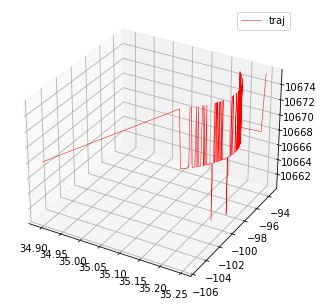

a35157


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


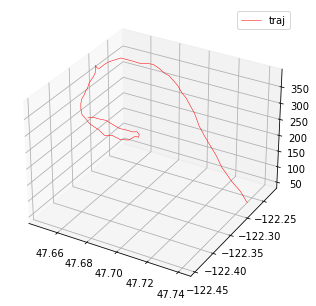

861b64


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


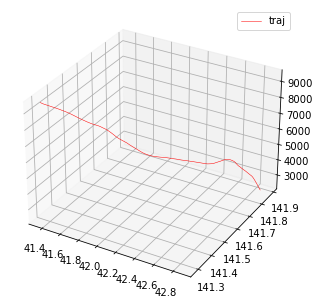

a9fb4e


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


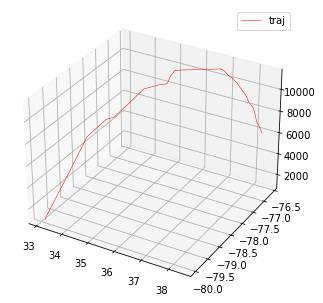

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a18e7d


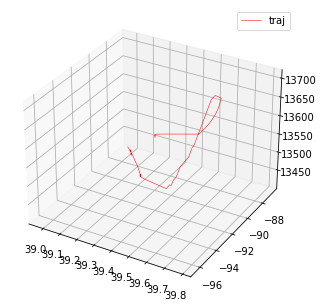

a6bf5a


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


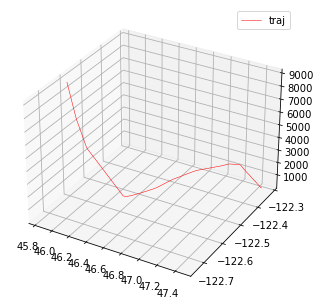

406814


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


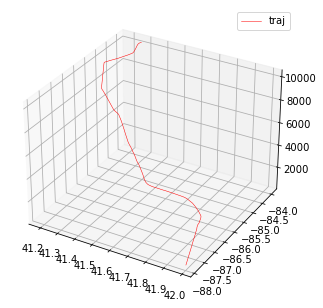

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a3c5fd


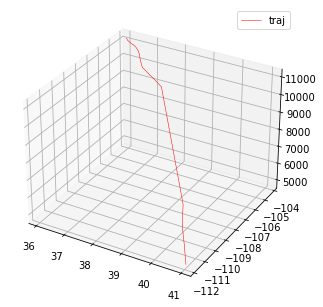

345686


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


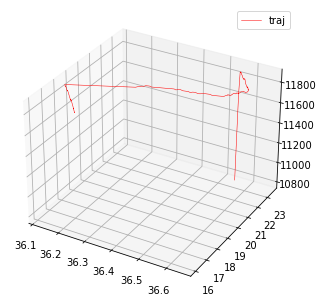

a33b23


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


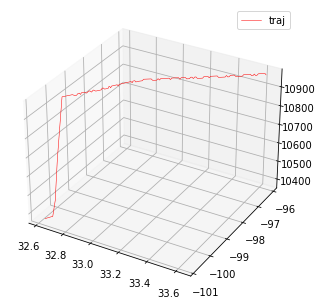

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


ab3014


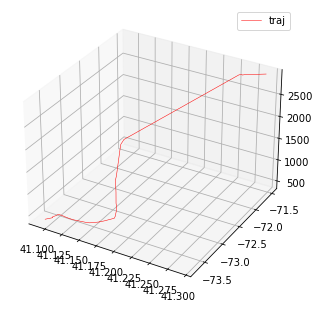

a1235b


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


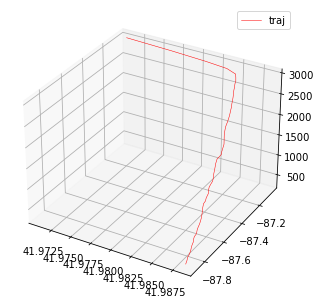

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a4b7d7


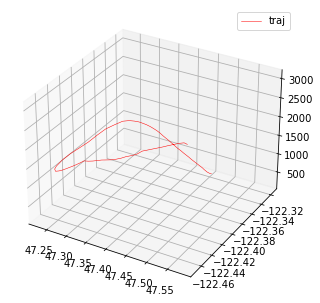

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


aa26b3


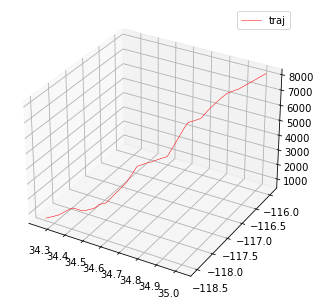

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


ad3fde


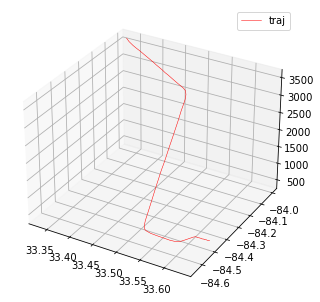

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


abe3e6


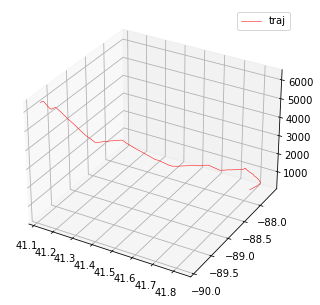

abf025


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


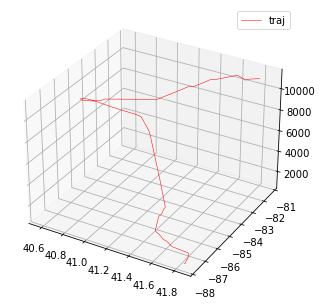

4ac962


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


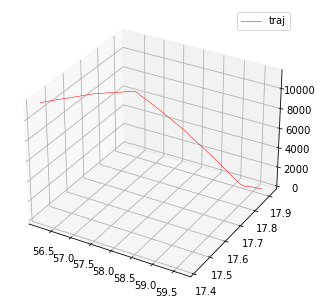

a4421d


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


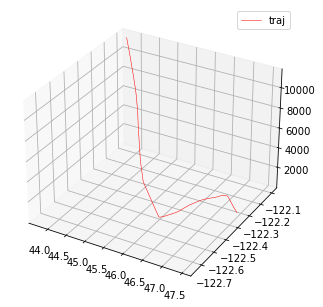

aad3a0


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


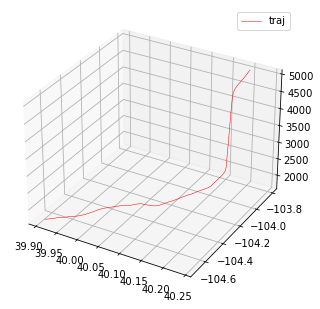

aa02ab


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


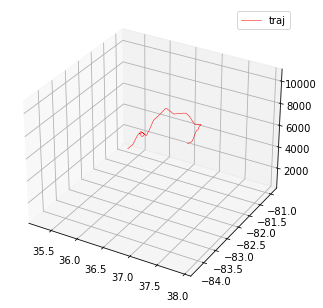

a5f5bf


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


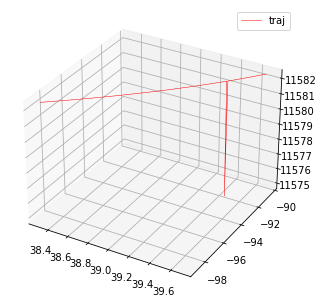

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


7c4ed8


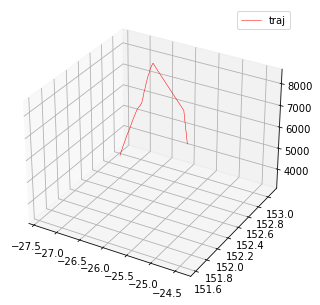

a61d00


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


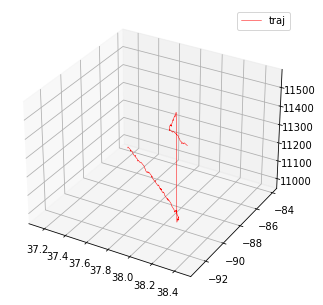

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a05269


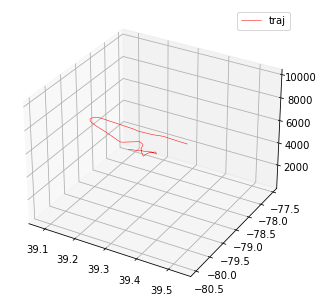

7cf86e


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


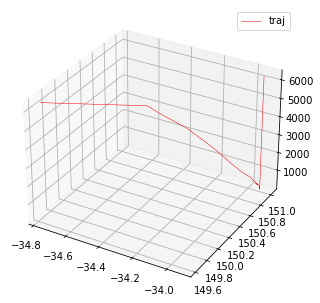

a810ac


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


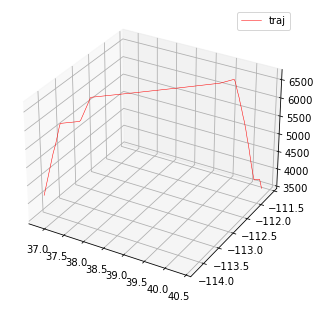

a64e67


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


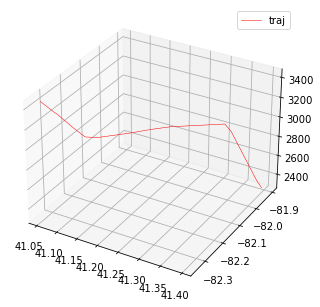

a6c07f


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


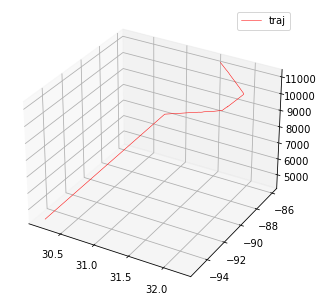

a8b8b9


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


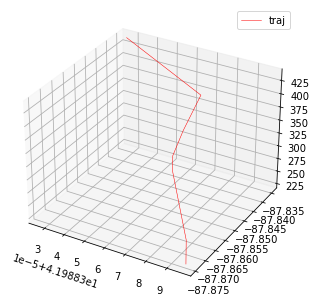

ac2bd4


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


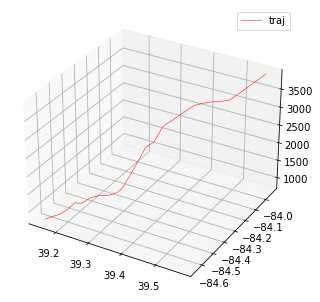

a2348d


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


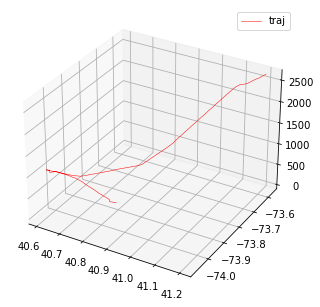

a35d9d


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


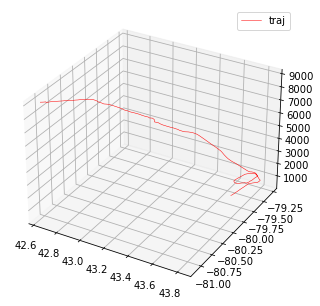

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a481fd


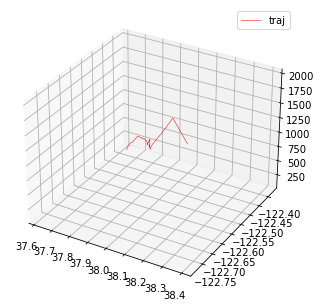

abdf3f


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


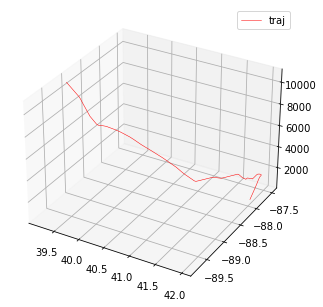

ad6ecb


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


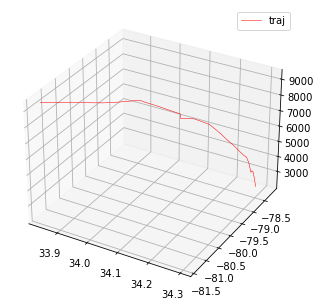

aaa86a


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


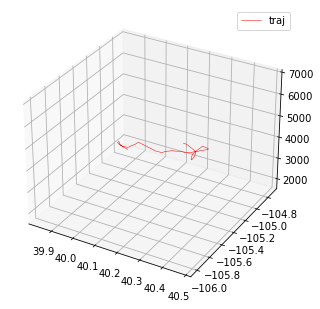

ad2ce1


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


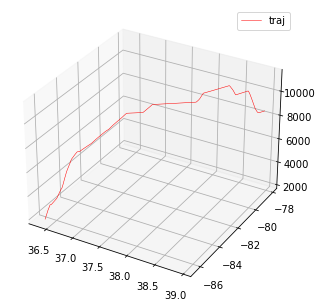

a3904c


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


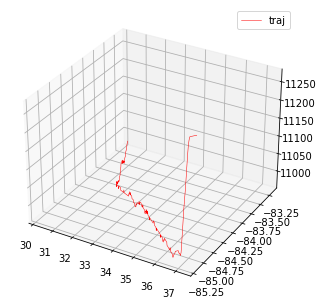

a678e5


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


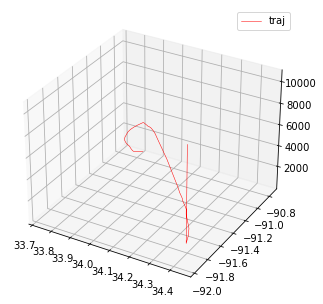

c06703


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


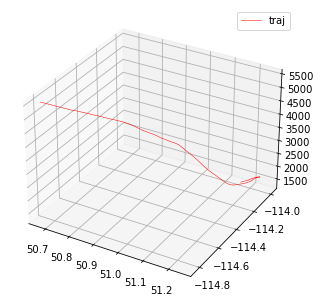

e48e78


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


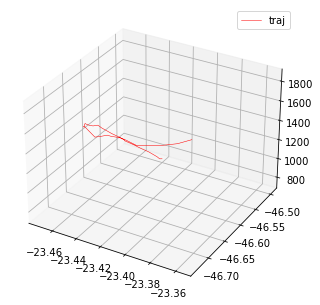

86da40


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


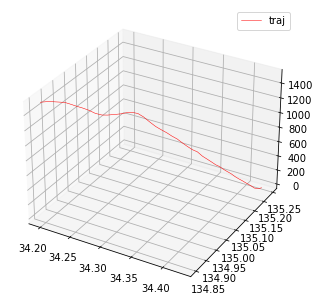

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


ad6b14


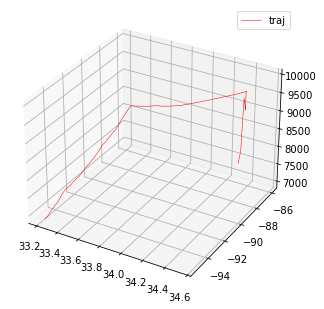

ac259b


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


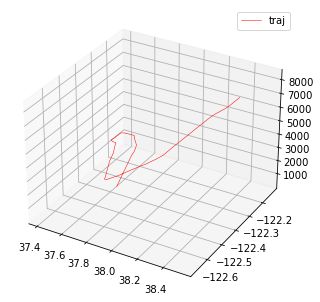

a017a8


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


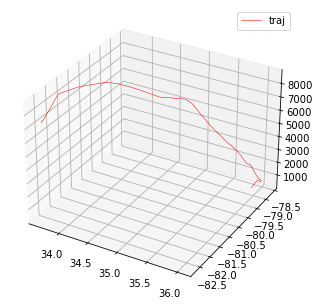

040078


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


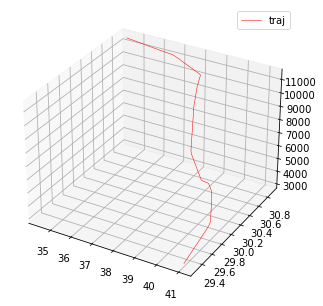

407177


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


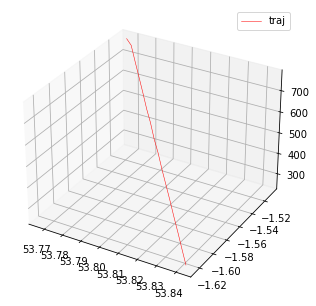

a31533


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


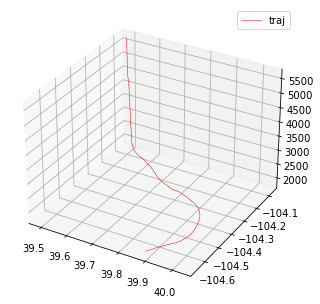

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


a84660


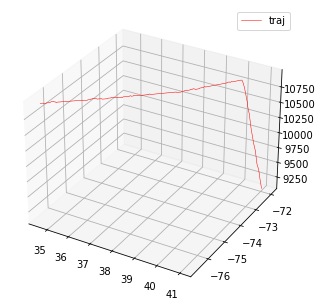

a48321


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


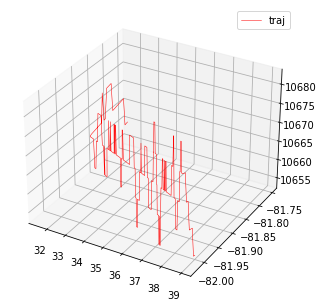

a20d0e


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


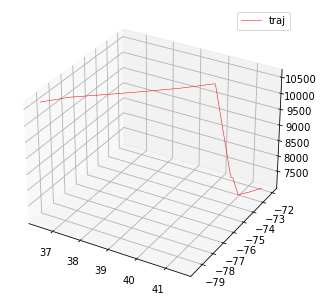

a86540


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


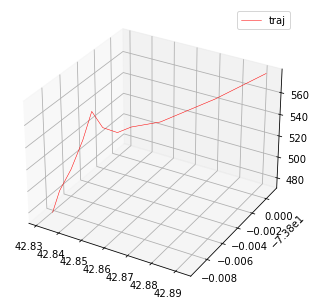

ad185a


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


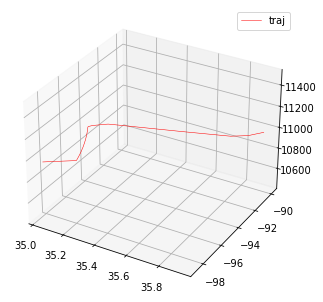

a79898


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


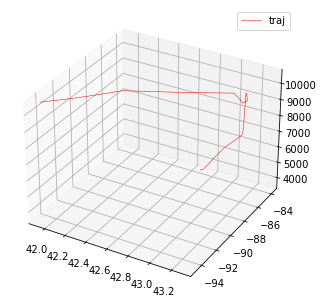

D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


781be8


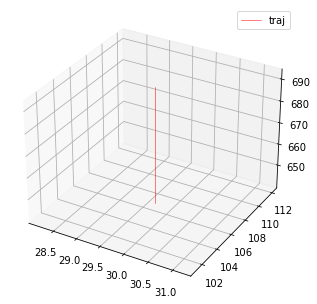

a88d3c


D:\devsoft\conda\envs\tp\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


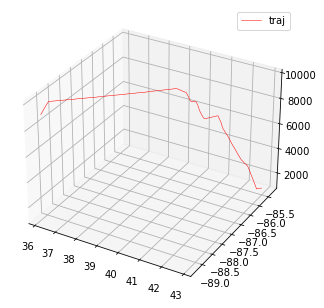

In [62]:
for id in icao24_list:
    plt_data = preprocess_data[fileter_data['icao24'] ==id]
    print(id)
    show_3D(np.array(plt_data))

In [73]:
preprocess_data.to_csv('preprocess.csv',index=False)

### 下方代码不执行 

In [57]:
# import pandas as pd
# data = pd.read_csv('data.csv')
# df = pd.DataFrame(data)
# # 忽略最后一行onground
# # df =df.iloc[:, :-1]

# id_list = df['segment'].unique()
# # 选择前n个
# part_id = id_list[:20]
# print(part_id)
# # print(len(id_list))
# segment_list = df['segment'].unique()
# print(len(segment_list))
# df.info()

[ 1  2  3  4  5  6  8  7  9 11 10 13 12 17 14 16 15 18 20 19]
16275
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 996563 entries, 0 to 996562
Data columns (total 7 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   time          996563 non-null  int64  
 1   segment       996563 non-null  int64  
 2   lat           996563 non-null  float64
 3   lon           996563 non-null  float64
 4   baroaltitude  996563 non-null  float64
 5   velocity      996563 non-null  float64
 6   heading       996563 non-null  float64
dtypes: float64(5), int64(2)
memory usage: 53.2 MB


### 过滤数据

In [ ]:
# 保留icao24值小于3000的值
fileter_data = df.groupby(by=[df['segment']]).apply(lambda x: x[x['segment'] <3000])
fileter_data.info()

In [ ]:
# 过滤掉轨迹长度小于40的点
# fileter_data = df.groupby(by=[df['callsign']]).filter(lambda x: len(x) >= 20)
# 过滤掉下降（baroaltitude<0）的点
# fileter_data = fileter_data.loc[df['baroaltitude']>0]
# 选择lat在20-40之间的航迹点
# fileter_data = fileter_data[(df['lat']>20) & (df['lat']<40)]
# fileter_data = fileter_data.loc[([df['lon']>20]) & ([df['lon']<40])]
# 过滤掉高度小于0
# fileter_data = fileter_data.groupby(by=[fileter_data['icao24']]).apply(lambda x: x[x['baroaltitude'] > 0])
# filter_id_list = fileter_data['icao24'].unique()
# len(filter_id_list)

In [ ]:
# 保留icao24值小于3000的值
# fileter_data = df.groupby(by=[df['segment']]).apply(lambda x: x[x['segment'] <3000])
# fileter_data.info()

# 过滤掉轨迹长度小于40的点
# fileter_data = df.groupby(by=[df['callsign']]).filter(lambda x: len(x) >= 20)
# 过滤掉下降（baroaltitude<0）的点
# fileter_data = fileter_data.loc[df['baroaltitude']>0]
# 选择lat在20-40之间的航迹点
# fileter_data = fileter_data[(df['lat']>20) & (df['lat']<40)]
# fileter_data = fileter_data.loc[([df['lon']>20]) & ([df['lon']<40])]
# 过滤掉高度小于0
# fileter_data = fileter_data.groupby(by=[fileter_data['icao24']]).apply(lambda x: x[x['baroaltitude'] > 0])
# filter_id_list = fileter_data['icao24'].unique()
# len(filter_id_list)

In [ ]:
# 保留icao24值小于3000的值
fileter_data = df.groupby(by=[df['segment']]).apply(lambda x: x[x['segment'] <3000])
fileter_data.info()

In [ ]:
# 过滤掉轨迹长度小于40的点
# fileter_data = df.groupby(by=[df['callsign']]).filter(lambda x: len(x) >= 20)
# 过滤掉下降（baroaltitude<0）的点
# fileter_data = fileter_data.loc[df['baroaltitude']>0]
# 选择lat在20-40之间的航迹点
# fileter_data = fileter_data[(df['lat']>20) & (df['lat']<40)]
# fileter_data = fileter_data.loc[([df['lon']>20]) & ([df['lon']<40])]
# 过滤掉高度小于0
# fileter_data = fileter_data.groupby(by=[fileter_data['icao24']]).apply(lambda x: x[x['baroaltitude'] > 0])
# filter_id_list = fileter_data['icao24'].unique()
# len(filter_id_list)

In [62]:
# 保留icao24值小于3000的值
# fileter_data = df.groupby(by=[df['segment']]).apply(lambda x: x[x['segment'] <3000])
# fileter_data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 178036 entries, (1, 0) to (2999, 177933)
Data columns (total 7 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   time          178036 non-null  int64  
 1   segment       178036 non-null  int64  
 2   lat           178036 non-null  float64
 3   lon           178036 non-null  float64
 4   baroaltitude  178036 non-null  float64
 5   velocity      178036 non-null  float64
 6   heading       178036 non-null  float64
dtypes: float64(5), int64(2)
memory usage: 12.0 MB


In [10]:
# 过滤掉轨迹长度小于40的点
# fileter_data = df.groupby(by=[df['callsign']]).filter(lambda x: len(x) >= 20)
# 过滤掉下降（baroaltitude<0）的点
# fileter_data = fileter_data.loc[df['baroaltitude']>0]
# 选择lat在20-40之间的航迹点
# fileter_data = fileter_data[(df['lat']>20) & (df['lat']<40)]
# fileter_data = fileter_data.loc[([df['lon']>20]) & ([df['lon']<40])]
# 过滤掉高度小于0
# fileter_data = fileter_data.groupby(by=[fileter_data['icao24']]).apply(lambda x: x[x['baroaltitude'] > 0])
# filter_id_list = fileter_data['icao24'].unique()
# len(filter_id_list)

In [63]:
fileter_data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 178036 entries, (1, 0) to (2999, 177933)
Data columns (total 7 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   time          178036 non-null  int64  
 1   segment       178036 non-null  int64  
 2   lat           178036 non-null  float64
 3   lon           178036 non-null  float64
 4   baroaltitude  178036 non-null  float64
 5   velocity      178036 non-null  float64
 6   heading       178036 non-null  float64
dtypes: float64(5), int64(2)
memory usage: 12.0 MB


In [60]:
fileter_data.to_csv("filter_data.csv",index=False)


# 不执行

In [ ]:
# 去重
filter_id_list = fileter_data['icao24'].unique()
dup_col = ['icao24', 'lat', 'lon', 'baroaltitude']
dup_col2 = ['timestep','icao24']
df_dup = fileter_data[fileter_data.duplicated(dup_col)]
# df_dup.sort_values(by=['icao24','time'],inplace=True)
# df_dup.head(50)
# 得到数据重复的id
dup_id = df_dup['icao24'].unique()
# 得到唯一数据的id列表
diff_id = [id for id in filter_id_list if id not in dup_id]
# 筛选出唯一数据
data= fileter_data[fileter_data['icao24'].isin(diff_id)]
data.info()

In [ ]:
# 去除重复点数据
data.drop_duplicates(subset=['timestep','icao24'],keep='first',inplace=True)
data.info()

data.sort_values(by=['icao24','timestep'],inplace=True)
data.head(50)

In [ ]:
data.to_csv('filter_dup_20210423.csv', index=False)
